## Organization of Jupyter-Notebook
- (1.) Download of 10-K Filings using the SEC-API
    - (1.1) Downloading & Organizing Metadata
    - (1.2) Downloading 10-K Filings
- (2) Preprocessing Filings 
- (3) Loading and Preparing Financial Data
- (4) Filtering Filing Data
    - (4.1) Loading Text & Initial Filtering (Duplicate- & NaN-Removal, CRSP-Match)
    - (4.2) Adding Financial Data for Further Filtering
    - (4.3) Final Filtering-Steps 
- (5) TF-IDF Sentiment Scores
- (6) Descpritives & Visualizationsons


In [2]:
import numpy as np
import pandas as pd

from datetime import datetime, timedelta
from pathlib import Path
import os
import json

import re
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.preprocessing import LabelEncoder

import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

import plotly.graph_objects as go
from plotly.subplots import make_subplots

from wordcloud import WordCloud

import statsmodels.api as sm

from tqdm.auto import tqdm

import wrds

from sec_api import QueryApi, RenderApi, MappingApi, ExtractorApi

# (1) Download of 10-K Filings using the SEC-API

### (1.1) Download & Organize Metadata

In [74]:
# Download financial data from W/R/D/S (specifically: CRSP) for all companies ...
# ... that were S&P 500 constituents at some point during sample period (2002-2021)

def get_sp500_constituents(end_date_string='2021-12-31'):
    
    """
    Download data for all companies that were historical constituents of the S&P 500 during sample period.
    Downloaded data includes various identifiers and additional descriptive information.

    Args:
    - end_date_string (str): End date of the sample period (default: '2021-12-31')

    Returns:
    - sp500_constituents: DataFrame containing S&P 500 constituents data
    """

    # Filename for storing downloaded data
    filename = 'sp500_constituents'

    # Check if data has already been downloaded
    if Path(filename + '.csv').is_file():
        # Load data from CSV-file if available 
        sp500_constituents = pd.read_csv(filename + '.csv', index_col="Unnamed: 0")
        print('✅ List of S&P 500 constituents has been loaded from CSV-file.')   
    else:
        # If data not found, download from CRSP

        # Establish connection to W/R/D/S CRSP database
        conn = wrds.Connection()

        # Query to fetch S&P 500 data from CRSP database
        sp500 = conn.raw_sql("""
                        SELECT a.*, b.date, b.ret
                        FROM crsp.msp500list as a,
                        crsp.msf AS b
                        WHERE a.permno = b.permno
                        AND b.date >= a.start and b.date <= a.ending
                        AND b.date>='01/01/2002'
                        ORDER BY date;
                        """, date_cols=['start', 'ending', 'date'])

        
        ## Additional data processing steps ##
        # Add other descriptive variables
        mse = conn.raw_sql(""" SELECT comnam, ncusip, namedt, nameendt, permno, shrcd, exchcd, hsiccd, ticker
                            FROM crsp.msenames """, date_cols=['namedt', 'nameendt'])
        
        # if nameendt is missing then set to today date
        mse['nameendt']=mse['nameendt'].fillna(pd.to_datetime('today'))
        
        # Merge with SP500 data
        sp500_full = pd.merge(sp500, mse, how = 'left', on = 'permno')
        
        # Impose the date range restrictions
        sp500_full = sp500_full.loc[(sp500_full.date>=sp500_full.namedt) & (sp500_full.date<=sp500_full.nameendt)]
        
        # Linking with Compustat through CCM (= CRSP/Compustat Merged)
        ccm=conn.raw_sql(""" SELECT gvkey, liid AS iid, lpermno AS permno, linktype, linkprim, linkdt, linkenddt
                          FROM crsp.ccmxpf_linktable 
                          WHERE substr(linktype,1,1)='L'
                          AND (linkprim ='C' or linkprim='P') """, date_cols=['linkdt', 'linkenddt'])
        
        # if linkenddt is missing then set to today date
        ccm['linkenddt']=ccm['linkenddt'].fillna(pd.to_datetime('today'))
        
        # Merge the CCM data with S&P500 data
        # First: Link by matching PERMNO
        sp500ccm = pd.merge(sp500_full, ccm, how='left', on=['permno'])
        
        # Then: Set link date bounds
        sp500ccm = sp500ccm.loc[(sp500ccm['date']>=sp500ccm['linkdt']) & (sp500ccm['date']<=sp500ccm['linkenddt'])]
        
        # Rearrange columns
        sp500ccm = sp500ccm.drop(columns=['namedt', 'nameendt', 'linktype', 'linkprim', 'linkdt', 'linkenddt'])
        sp500ccm = sp500ccm[['date', 'permno', 'comnam', 'ncusip', 'shrcd', 'exchcd', 'hsiccd', 'ticker', \
                     'gvkey', 'iid', 'start', 'ending', 'ret']]
        
        # Filter data based on specified end date
        end_date = datetime.strptime(str(end_date_string), '%Y-%m-%d')
        sp500_constituents = sp500ccm[sp500ccm["date"] <= end_date]

        
        ## Exporting data to CSV and Excel formats ##
        # Get current working directory
        cwd = str(Path.cwd())
        
        # Export the dataframe to csv format
        filepath_csv = cwd + '\\' + filename + '.csv'
        sp500_constituents.to_csv(filepath_csv)
        
        # Export the dataframe to Excel format
        filepath_excel = cwd + '\\' + filename + '.xlsx'
        sp500_constituents.to_excel(filepath_excel)
        
        print('✅ List of S&P 500 constituents has been downloaded.')
        
    return sp500_constituents
        

In [75]:
# Download or laod S&P 500 constituents data
sp500_constituents = get_sp500_constituents()
# Display first 5 rows 
sp500_constituents.head()

✅ List of S&P 500 constituents has been loaded from CSV-file.


,date,permno,comnam,ncusip,shrcd,exchcd,hsiccd,ticker,gvkey,iid,start,ending,ret
0,2002-01-31,76656.0,MEDIMMUNE INC,58469910,11.0,3.0,2830.0,MEDI,24008,01,2000-06-16,2007-05-31,-0.085868
1,2002-01-31,83693.0,SIEBEL SYSTEMS INC,82617010,11.0,3.0,7370.0,SEBL,63180,01,2000-05-05,2006-01-31,0.264832
2,2002-01-31,83413.0,SAPIENT CORP,80306210,11.0,3.0,7370.0,SAPE,62602,01,2000-05-05,2002-05-10,-0.287565
3,2002-01-31,89001.0,A T & T WIRELESS SVCS INC,00209A10,11.0,1.0,4812.0,AWE,134845,01,2001-07-09,2004-10-26,-0.199722
5,2002-01-31,32379.0,GREAT LAKES CHEM CORP,39056810,11.0,1.0,2819.0,GLK,5306,01,1991-11-25,2005-07-01,-0.050247


In [76]:
# Convert columns to appropriate data types
date_columns = ['date', 'start', 'ending']
sp500_constituents[date_columns] = sp500_constituents[date_columns].apply(pd.to_datetime, errors='coerce')

sp500_constituents['permno'] = sp500_constituents['permno'].astype('int64')

In [77]:
# Drop duplicate rows based on 'ticker' column and keep only necessary columns
sp500_unique_tickers = sp500_constituents[['ticker', 'start', 'ending']].drop_duplicates(subset='ticker')
sp500_unique_tickers.reset_index(drop=True, inplace=True)

print('No. of unique tickers:', len(sp500_unique_tickers), '\n-------------------------------')
sp500_unique_tickers.head()

No. of unique tickers: 992 

-------------------------------


,ticker,start,ending
0,MEDI,2000-06-16,2007-05-31
1,SEBL,2000-05-05,2006-01-31
2,SAPE,2000-05-05,2002-05-10
3,AWE,2001-07-09,2004-10-26
4,GLK,1991-11-25,2005-07-01


In [78]:
# Extract all unique tickers into a list
unique_tickers_list = list(sp500_unique_tickers['ticker'])

In [79]:
# Create batches of tickers: [[ticker_1,ticker_2,ticker_3], [ticker_4,ticker_5,ticker_6], ...]
# A single batch has a maximum of max_length_of_batch tickers

def create_batches(tickers=[], max_length_of_batch = 100):
    """
    Creates batches of tickers with a maximum length for each batch to better deal with API request size limitations in subsequent donwload.

    Args:
    - tickers (list): List of tickers to be batched
    - max_length_of_batch (int): Maximum number of tickers in each batch.

    Returns:
    - List of batches containing ticker groups.
    """
    batches = [[]]
    
    for ticker in tickers:
        
        if len(batches[len(batches)-1]) == max_length_of_batch:
            batches.append([])
            
        batches[len(batches)-1].append(ticker)
    
    return batches

In [80]:
# Download the metadata using the offical SEC Query API

# Personal api-key
#'088a7b79a7455e23cb5ef8a196a78d9d52e9030069a61a0bc958e26735ac7550'

def download_10K_metadata(tickers = [], start_year = 2002, end_year = 2021, api_key='####'):
    """
    Downloads metadata for 10-K filings using the SEC Query API

    Args:
    -
    - tickers (list): List of all tickers for which to download metadata
    - start_year (int): Start year of the download (Default=2002)
    - end_year (int): End year of the download (Default=2021)
    - api_key (str): Personal API key for SEC API (Default='####')
        
    Returns:
    - DataFrame consisting with columns:
        - ticker
        - cik
        - filing_date
        - filing_url
        - form_type
    """
    
    # Filename of the (to be) stored metadata
    filename = f"new_metadata_txt_{start_year}-{end_year}.csv"

    
    # Check if metadata has been previously downloaded and stored
    if Path(filename).is_file():
        result = pd.read_csv(filename)
        print('✅ Metadata loaded from CSV file')
        
        return result
    else:
        
        print('✅ Starting download process')

        # Initialize SEC Query API with provided API key
        queryApi = QueryApi(api_key=api_key)
        
        # Create ticker batches, with 100 tickers per batch
        batches = create_batches(tickers)
        frames = []

        # Loop through each year in the specified range
        for year in range(start_year, end_year + 1):

            # Loop through ticker batches for the current year 
            for batch in batches:
                
                tickers_joined = ', '.join(batch)
                ticker_query = 'ticker:({})'.format(tickers_joined)
            
                query_string = '{ticker_query} AND filedAt:[{start_year}-01-01 TO {end_year}-12-31] AND formType:"10-K" AND NOT formType:"10-K/A" AND NOT formType:NT'.format(ticker_query=ticker_query, start_year=year, end_year=year)
            
                query = {"query": { "query_string": {"query": query_string, "time_zone": "America/New_York"} }, "from": "0", "size": "200", "sort": [{ "filedAt": { "order": "desc" } }]}

                # Query the SEC API to get filings metadata
                response = queryApi.get_filings(query)
            
                filings = response['filings']
                
                # Extract relevant metadata information from the API response
                metadata = list(map(lambda f: {'ticker': f['ticker'], 'cik': f['cik'], 'form_type': f['formType'], 'filing_date': f['filedAt'], 'filing_url': f['linkToFilingDetails']}, filings))
                
                df = pd.DataFrame.from_records(metadata)
            
                frames.append(df)
                
            print('✅ Downloaded metadata for year', year)

        # Concatenate all dataframes and store in CSV file
        result = pd.concat(frames)
        result.to_csv(filename, index=False)
    
        number_metadata_downloaded = len(result)
        
        print('✅ Download completed. Metadata downloaded for {} filings.'.format(number_metadata_downloaded))
    
        return result

In [81]:
# Download metadata for 10-K filings
metadata = download_10K_metadata(tickers=unique_tickers_list)

# Convert entries of filing-date column from string to datetime
#metadata["filing_date"] = metadata["filing_date"].astype(str).apply(lambda x: x[:10])
metadata["filing_date"] = pd.to_datetime(metadata['filing_date'].str[:10], format='%Y-%m-%d')

✅ Metadata loaded from CSV file


In [82]:
metadata.head()

,ticker,cik,form_type,filing_date,filing_url
0,PGL,77385,10-K,2002-12-13,https://www.sec.gov/Archives/edgar/data/77385/...
1,NAV,808450,10-K,2002-12-12,https://www.sec.gov/Archives/edgar/data/808450...
2,JAVA,709519,10-K,2002-09-30,https://www.sec.gov/Archives/edgar/data/709519...
3,MXIM,743316,10-K,2002-09-25,https://www.sec.gov/Archives/edgar/data/743316...
4,ADM,7084,10-K,2002-09-20,https://www.sec.gov/Archives/edgar/data/7084/0...


In [83]:
# Filter the metadata based on whether the company was an active constituent at the time of the respective filing

# Initialize new bool-column
metadata["active_constituent"] = False

# Loop through the metadata of all filings for all tickers that have ever been in the S&P 500 during period of interest
for index, row in tqdm(metadata.iterrows()):

    # Recall: Metadata has columns               -> ticker | cik | formType | filedAt
    # Recall: sp500_constituents has columns     -> ticker | start | ending
    
    # Get the current ticker for every filing of all tickers that have ever been in the S&P 500 during period of interest
    curr_constituent = metadata.loc[index, "ticker"]

    # Get the exact filing date of the current filing of current ticker
    curr_filing_date = metadata.loc[index, "filing_date"]

        
    # Assign True to new column "active_consituent" if the current_filing_date of the current ticker ...
    # ... falls in the period of index-constituency for that ticker
    
    try:
        
        # Get the start_date of index-constituency of the current ticker
        start_date = sp500_constituents[sp500_constituents["ticker"] == curr_constituent]["start"].iloc[0]
    
        # Get the end_date of index-constituency of the current ticker
        end_date = sp500_constituents[sp500_constituents["ticker"] == curr_constituent]["ending"].iloc[0]

        metadata.loc[index, "active_constituent"] = ((start_date <= curr_filing_date) & (curr_filing_date <= end_date))
        metadata.loc[index, "start_date"] = start_date
        metadata.loc[index, "end_date"] = end_date
        
    except:
        pass

0it [00:00, ?it/s]

In [84]:
# Reduce metadata/filings down to active constituents
metadata = metadata[metadata['active_constituent'] == True]
metadata = metadata.sort_values(by=['filing_date'], ignore_index=True)

In [85]:
# Drop any remaining duplicate filings
metadata = metadata.drop_duplicates(subset=["cik", "filing_date"])
# Sort by filing date
metadata = metadata.sort_values(by='filing_date').reset_index(drop=True)

print('No. of filings:', len(metadata))
metadata.head()

No. of filings: 8847


,ticker,cik,form_type,filing_date,filing_url,active_constituent,start_date,end_date
0,DG,29534,10-K,2002-01-14,https://www.sec.gov/Archives/edgar/data/29534/...,True,1998-07-16,2007-07-06
1,ADCT,61478,10-K,2002-01-16,https://www.sec.gov/Archives/edgar/data/61478/...,True,1999-08-02,2007-06-29
2,A,1090872,10-K,2002-01-22,https://www.sec.gov/Archives/edgar/data/109087...,True,2000-06-05,2022-12-30
3,AMAT,6951,10-K,2002-01-23,https://www.sec.gov/Archives/edgar/data/6951/0...,True,1995-03-16,2022-12-30
4,ADI,6281,10-K,2002-01-28,https://www.sec.gov/Archives/edgar/data/6281/0...,True,1999-10-12,2022-12-30


In [86]:
# Export the final metadata DataFrame to a CSV file
metadata.to_csv('metadata.csv', index=False)

### (1.2) Download 10-K Filings

In [87]:
#metadata = pd.read_csv('metadata.csv')

In [88]:
def download_raw_10k_filings(start_year=2002, end_year=2021, selected_items='all'):
    """
    Downloads either the full, raw 10-K filings or the merely subsection/item 7 for a specified period and selected items using the SEC ExtractorAPI
    
    Args:
    - start_year (int): Starting year for the download (Default=2001)
    - end_year (int): Ending year for the download (Default=2021)
    - selected_items (str):  Indication of which sections/items to download
          (Sections to be extracted from 10-K filings)
            - Item 7 is wanted, specify: 
              '7'
            - All sections are wanted/needed, specify:
              'all'
    Logic/process:
    - Create a folder to hold the raw text-files of all 10-K filings: "raw_filings_text.txt"
    - Subset the date-sorted metadata DataFrame for the specified period 
    - Loop over the metadata of all subsetted filings
    - Create a subfolder within "raw_filings_text" per year: "raw_year"
    - If the specific filing was already downloaded: 
        - Skip to next filing in the metadata
    - Else: 
        - Download the (specified sections of the) filing using the official SEC ExtractorAPI
        - Save the downloaded file as: "yyyy-mm-dd_ticker_year.txt" to the subfolder "raw_year"
        
    Returns:
    - Tuple: 
        - start_year
        - end_year
        - index_start (of the sorted metadata DataFrame for the specified period)
        - index_end (of the sorted metadata DataFrame for the specified period)
        
    """
    extractorApi = ExtractorApi("088a7b79a7455e23cb5ef8a196a78d9d52e9030069a61a0bc958e26735ac7550")
    
    # Define the items of 10-Ks that are meant to be downloaded
    if selected_items == 'all':
        items = ["1", "1A", "1B", "2", "3", "4", "5", "6", "7", "7A", "8", "9A", "9B", "10", "11", "12", "13", "14"]
    else: 
        items = selected_items
    
    # Create a directory/folder to hold all raw filings called: raw_filings_item_7
    if selected_items == '7':
        directory = './raw_filings_item_7'
    else:
        directory = './raw_filings_full'

    try:
        os.mkdir(directory)
    except FileExistsError:
        pass
    
    
    # Loop over the metadata of all relevant filings depending on specified start_year and end_year
    # Find the start & end index in the (sorted) metadata to eventually loop over the relevant metadata
    
    index_start = metadata[metadata.filing_date.dt.year == start_year].first_valid_index()
    index_end = metadata[metadata.filing_date.dt.year == end_year].last_valid_index()
            
    for index in tqdm(range(index_start, index_end+1)):
                
        curr_year = metadata.loc[index, 'filing_date'].year
        curr_filing_date = metadata.loc[index, 'filing_date']
        curr_ticker = metadata.loc[index, 'ticker']
        filing_url = metadata.loc[index, 'filing_url']              
                
        # Create a sub-directory in "raw_filings" for the current year 
        curr_directory = directory + f'/raw_{curr_year}'
                
        try:
            os.mkdir(curr_directory)
        except FileExistsError:
            # If folder for current year already exists: Filings have already been downloaded
            # -> No need to create new folder
            pass
        
        filename = curr_directory + '/' + str(curr_filing_date)[0:10] + '_' + str(curr_ticker)
                
        # If specific filing has already been downloaded/saved: Skip to next iteration
        if Path(filename).is_file():
            continue
        else: 
            try:
                next_year = metadata.loc[index+1, 'filing_date'].year
            except KeyError:
                next_year = curr_year
    
            filing_text = ""

            filing_text = extractorApi.get_section(filing_url=filing_url, section=items, return_type="text")
    
    
            # Save the current filing for a given year to a separate .txt-file of that year
            # Naming convention: yyyy-mm-dd_ticker.txt
            with open(filename, 'w') as f:
                f.write(filing_text)
                f.close
                    
            if curr_year != next_year:
                print('✅ Successful download of filings for the year: ' + str(curr_year))
            
            
    print('✅ Completed.')
            
    # At this point we already looped over the metadata of all filings not yet downloaded
    # Hence, there is no need to go back into initial, outer loop --> return to stop function
        
    return (start_year, end_year, index_start, index_end)

In [89]:
# Download of full filings
start_year, end_year, index_start, index_end = download_raw_10k_filings(start_year=2002, end_year=2021, selected_items='all')

  0%|          | 0/8847 [00:00<?, ?it/s]

✅ Completed.


# (2) Preprocessing Filings 

In [90]:
#metadata = pd.read_csv('metadata.csv')

In [91]:
def remove_unwanted_chars(text):
    """
    Cleans the input text by removing specified unwanted characters and patterns.

    Args:
    - text (string): Text to be cleaned

    Returns: 
    - Cleaned text after removing specified unwanted characters and patterns.
    
    - General logic:
        Step 1: 
            - Remove anything in-between the table-start and table-end tags 
            - Replace removed content with a space
        Step 2: 
            - Remove all unwanted characters listed below
            - Replace removed characters with a space
        Step 3:
            - Remove multiple spaces

    List of unwanted characters with corresponding regex-expression:
    - New line characters:                \n
    - HTML entities:                      &#[0-9]+;
    - Contents within parentheses:        (?<=\().*(?=\))
    - Punctuation & special characters:   ["\'\\/\(\)+,.;:{}$%&_-]
        
        Specifically:
        - Double-quotes   "             - Semi-colon      ;
        - Single-quotes   '             - Colon           :
        - Back-slashes    \             - Curly Brackets  {}
        - Forward-slash   /             - Dollar-sign     $
        - Parentheses     ( )           - Ampersand       &
        - Square Brackets [ ]           - Underscore      _
        - Plus-sign       +             - Dash            -
        - Comma           ,       
        - Period          .
              
        - Table-tags:                         ##table_start|##table_end
        - Numbers: [0-9]{1,}
        - Multiple, consective dashes,
          equal-signs, periods:                '[-=.]{2,}'
    """


    # Define regex patterns for unwanted characters/patterns
    patterns = [
        r'\n', # New line characters
        r'&#[0-9]+;', # HTML entities, e.g., &#160
        r'["\'\\/\(\)+,.;:{}[]$%&_-]', # Punctuation and special characters
        r'[0-9]{1,}', # Numbers
        r'[-=.]{2,}' # Multiple, consecutive dashes/equal-signs/periods
    ]


    # Remove anything in-between parentheses (including nested parantheses)
    def remove_content_between_parentheses(text):
        for _ in range(3):  # Loop to handle nested parentheses up to 3 levels
            text = re.sub(r'\([^()]*\)', '', text)
        return text

    # Remove unwanted characters based on regex patterns
    cleaned_filing = text
    for pattern in patterns:
        cleaned_filing = re.sub(pattern, ' ', cleaned_filing)

    # Remove anything in between table-tags
    cleaned_filing = re.sub(r'##table_start|##table_end', ' ', cleaned_filing)
    
    # Remove content between parentheses
    cleaned_filing = remove_content_between_parentheses(cleaned_filing)

    # Remove multiple spaces
    cleaned_filing = re.sub(r'\s\s+', ' ', cleaned_filing)   
        
    return cleaned_filing

In [92]:
def remove_stopwords(raw_tokens):
    """
    Filters the input-argument by removing stopwords usin NLTK's English stopwords list.

    Args:
    - raw_tokens (list): Unfiltered tokens including stopwords

    Returns:
    - filtered_tokens (list): Tokens excluding stopwords
    
    - Stopwords = Words that are grammatically important, but do not add any or only little context and meaning.
    - Used stopword list: Pre-defined, 'english' list from the NLTK-library
    - Example stopwords:
        - a
        - an
        - and
        - are
        - be
        - is 
        - ...
    """

    # Set of stopwords from NLTK's 'english' corpus
    stop_words = set(stopwords.words('english'))

    # List comprehension to filter out tokens not present in the stopwrods set
    filtered_tokens = [token for token in raw_tokens if token.lower() not in stop_words]
    
    return filtered_tokens

In [93]:
# Loop over downloaded filings (directly):
    # Clean the texts & save the cleaned versions in the directory: 
        # "cleaned_filings_text" with the sub-folders "clean_year"
    # Tokenize the cleaned texts & save the tokenized versions in the directory:
        # "tokenized_filings" with the sub-folders "tokens_year"

def preprocessing_filings(start_year, end_year, selected_items):
    """
    Perform preprocessing steps on downloaded filings and save cleaned and tokenized versions.

    Args:
    - start_year (int): Starting year for processing filings
    - end_year (int): Ending year for processing filings
    - selected_items (str): Indicates selected items ('7' or 'full')

    Output:
    - Saved directories for cleaned and tokenized filings
    - cleaned filings: Encompasses all preprocessing steps except stopword removal
    - tokenized filings: Builds upon cleaned filings and also removes stopwords
    
    Steps:
    (1) Create directories for cleaned and tokenized filings.
    (2) Loop through each year in the specified range.
    (3) Process individual files within each year's raw filings.
    (4) Clean, tokenize, lemmatize, and save the processed filings.
    """
    # Define directory paths for cleaned and tokenized filings
    if selected_items == '7':
        cleaned_directory = './cleaned_filings_item_7'
        tokenized_word_directory = './tokenized_word_filings_item_7'
    else:
        cleaned_directory = './cleaned_filings_full'
        tokenized_word_directory = './tokenized_word_filings_full'
    
    directory_list = [cleaned_directory, tokenized_word_directory]

    # Create directories if they do not exist
    for directory in directory_list:
        os.makedirs(directory, exist_ok=True)

    lemmatizer = WordNetLemmatizer()
    
    # Loop through each year within the specified range
    for year in range(start_year, end_year+1):

        # Define paths for current year's raw, cleaned, and tokenized filings
        if selected_items == '7':
            curr_raw_directory = f'./raw_filings_item_7/raw_{year}'
        else:
            curr_raw_directory = f'./raw_filings_full/raw_{year}'

        # Create sub-folder within "cleaned_filings_item_7" for each year 
        curr_cleaned_directory = f'{cleaned_directory}/cleaned_{year}'

        # Create/address sub-folder within "tokenized_word_filings" for each year 
        curr_tokenized_word_directory = f'{tokenized_word_directory}/tokens_word_{year}'

        # List of directories to create for the current year 
        curr_directory_list = [curr_cleaned_directory, curr_tokenized_word_directory]
        
        # Create directories for the current year if they do not exist
        for directory in curr_directory_list:
            os.makedirs(directory, exist_ok=True)
        
        # Loop through files in the current year's raw filings
        try:
            for file in tqdm(os.scandir(curr_raw_directory), desc=f'Filings of {year}'):

                if file.is_file():


                    curr_raw_path = file.path
                
                    if selected_items == '7':
                        #curr_filing_date = curr_raw_path[28:38]
                        #curr_ticker = curr_raw_path[39::]
                        curr_filename = curr_raw_path[28::]
                    else:

                        #curr_filing_date = curr_raw_path[28:38]
                        #curr_ticker = curr_raw_path[39::]
                        curr_filename = curr_raw_path[28::]
                    
                    # Read-in the filing content + lowercase the text
                    curr_filing_text = Path(curr_raw_path).read_text().lower()

                    # Remove unwanted characters
                    cleaned_filing = remove_unwanted_chars(curr_filing_text)

                    # Tokenize each filing
                    tokenized_word_filing = word_tokenize(cleaned_filing)

                    # Lemmatize the filtered tokens
                    lemmatized_word_tokens = [lemmatizer.lemmatize(token) for token in tokenized_word_filing]

                    # & Remove individual characters that may remain due to prior cleaning steps
                    # -> e.g., due to removal of numbers: "1950s" turned into "s" 
                    filtered_word_tokens = [token for token in lemmatized_word_tokens if len(token) > 2]

                    # Save cleaned filing to JSON file in the cleaned directory
                    with open(f'{curr_cleaned_directory}/{curr_filename}.json', 'w') as clean_f:
                        json.dump(filtered_word_tokens, clean_f, indent=2)

                    # Remove stopwords and save tokenized version to a new file in the tokenized directory
                    non_stopwords_word_tokens = remove_stopwords(filtered_word_tokens)

                    # Save tokenized filing
                    with open(f'{curr_tokenized_word_directory}/{curr_filename}.json', 'w') as token_f:
                        json.dump(non_stopwords_word_tokens, token_f, indent=2)

        except FileNotFoundError:
            pass

In [ ]:
preprocessing_filings(start_year=2002, end_year=2021, selected_items='all')

# (3) Loading and Preparing Financial Data

In [5]:
# Optional if not loaded already

# Load metadata from memory
#metadata = pd.read_csv('metadata.csv', usecols=['ticker', 'cik', 'filing_date'])

In [97]:
# Reading the raw financial data (downloaded manually from CRSP via W/R/D/S by passing ...
# ... the list of permnos from the constituency list (see start of this notebook) to the download-site

sp500_raw_nan = pd.read_csv('sp500_stocks_data.csv', index_col=0, low_memory=False)
sp500_raw_nan.head()

,PERMNO,SecurityNm,Ticker,DlyCalDt,DlyPrc,DlyCap,DlyPrevPrc,DlyPrevCap,DlyRet,DlyRetx,...,DlyClose,DlyLow,DlyHigh,DlyPrcVol,ShrOut,vwretd,vwretx,ewretd,ewretx,sprtrn
0,10078,SUN MICROSYSTEMS INC; COM NONE; CONS,SUNW,2002-01-02,13.04,42359396.8,12.30,39955566.0,0.060163,0.060163,...,13.04,12.50,13.090,5.195260e+08,3248420.0,0.003832,0.003712,0.007914,0.007854,0.005740
1,10078,SUN MICROSYSTEMS INC; COM NONE; CONS,SUNW,2002-01-03,13.42,43593796.4,13.04,42359396.8,0.029141,0.029141,...,13.42,13.16,13.551,7.501342e+08,3248420.0,0.009844,0.009830,0.012919,0.012895,0.009180
2,10078,SUN MICROSYSTEMS INC; COM NONE; CONS,SUNW,2002-01-04,13.93,45250490.6,13.42,43593796.4,0.038003,0.038003,...,13.93,13.74,14.200,1.121950e+09,3248420.0,0.006987,0.006986,0.011263,0.011251,0.006213
3,10078,SUN MICROSYSTEMS INC; COM NONE; CONS,SUNW,2002-01-07,13.61,44210996.2,13.93,45250490.6,-0.022972,-0.022972,...,13.61,13.49,14.350,7.282847e+08,3248420.0,-0.006531,-0.006535,-0.000112,-0.000128,-0.006499
4,10078,SUN MICROSYSTEMS INC; COM NONE; CONS,SUNW,2002-01-08,13.93,45250490.6,13.61,44210996.2,0.023512,0.023512,...,13.93,13.48,14.070,6.200193e+08,3248420.0,-0.002443,-0.002651,0.004929,0.004899,-0.003588


In [98]:
# Align column names with naming-conventions of previous DataFrames
new_column_names = ['permno', 'security_name', 'ticker', 'date', 'daily_price', 'daily_cap', 'daily_price_prev', 'daily_cap_prev', 'daily_ret_total', 'daily_price_ret', 'daily_ret_miss_flag', 'daily_vol', 'daily_close', 'daily_low', 'daily_high', 'daily_price_vol', 'shares_out', 'vw_ret_div', 'vw_ret', 'ew_ret_div', 'ew_ret', 'sp500_ret']
sp500_raw_nan.rename(columns={sp500_raw_nan.columns[i]: new_column_names[i] for i in range(len(sp500_raw_nan.columns))}, inplace=True)

# Convert 'date' column to datetime format
sp500_raw_nan['date'] = pd.to_datetime(sp500_raw_nan['date'], format='%Y-%m-%d')

# Sort the data by date and handle missing values 
sp500_sorted_nan = sp500_raw_nan.sort_values(by = ['date'] , ascending = True, ignore_index=True)
numeric_columns = sp500_sorted_nan.select_dtypes('number').columns.tolist()
sp500_sorted = sp500_sorted_nan.dropna(subset=numeric_columns).reset_index(drop=True)

# Save the sorted data without NaNs to a CSV file
sp500_sorted.to_csv('sp500_stocks_data_no_nan.csv')

In [99]:
# Add unique permno to each filing in the filings-DataFrame

filings = metadata

for index, filing in tqdm(filings.iterrows()):
    
    curr_ticker = filing['ticker']
    permno = sp500_sorted[sp500_sorted['ticker'] == curr_ticker]['permno'].iloc[0]
    filings.at[index, 'permno'] = permno


# Convert 'permno' column to int 
filings['permno'] = filings['permno'].astype(int)

# Save expanded metadata, i.e., 'filings' DataFrame to a CSV file
filings.to_csv('filings_permno.csv', index=False)

filings.head()

0it [00:00, ?it/s]

,ticker,cik,form_type,filing_date,filing_url,active_constituent,start_date,end_date,permno
0,DG,29534,10-K,2002-01-14,https://www.sec.gov/Archives/edgar/data/29534/...,True,1998-07-16,2007-07-06,30382
1,ADCT,61478,10-K,2002-01-16,https://www.sec.gov/Archives/edgar/data/61478/...,True,1999-08-02,2007-06-29,50906
2,A,1090872,10-K,2002-01-22,https://www.sec.gov/Archives/edgar/data/109087...,True,2000-06-05,2022-12-30,87432
3,AMAT,6951,10-K,2002-01-23,https://www.sec.gov/Archives/edgar/data/6951/0...,True,1995-03-16,2022-12-30,14702
4,ADI,6281,10-K,2002-01-28,https://www.sec.gov/Archives/edgar/data/6281/0...,True,1999-10-12,2022-12-30,60871


# (4) Filtering Filing-Data

In [53]:
# Optional if not loaded already

# Load financial data (in case not already done)
sp500_sorted = pd.read_csv('sp500_stocks_data_no_nan.csv', index_col=0, low_memory=False)
sp500_sorted['date'] = pd.to_datetime(sp500_sorted['date'])
sp500_sorted.head()

,permno,security_name,ticker,date,daily_price,daily_cap,daily_price_prev,daily_cap_prev,daily_ret_total,daily_price_ret,...,daily_close,daily_low,daily_high,daily_price_vol,shares_out,vw_ret_div,vw_ret,ew_ret_div,ew_ret,sp500_ret
0,72726,STATE STREET CORP; COM NONE; CONS,STT,2001-01-02,120.9500,19500889.45,124.2100,20026502.51,-0.026246,-0.026246,...,120.9500,118.0000,123.8500,83334550.0,161231.0,-0.03423,-0.034236,-0.001135,-0.001155,-0.028032
1,17478,MCGRAW HILL COS INC; COM NONE; CONS,MHP,2001-01-02,56.7500,11049225.00,58.6250,11414287.50,-0.031983,-0.031983,...,56.7500,56.3750,58.5000,16826375.0,194700.0,-0.03423,-0.034236,-0.001135,-0.001155,-0.028032
2,17743,BERKLEY W R CORP; COM NONE; CONS,BKLY,2001-01-02,46.5625,1194607.50,47.1875,1210642.50,-0.013245,-0.013245,...,46.5625,44.4375,47.3125,15397799.7,25656.0,-0.03423,-0.034236,-0.001135,-0.001155,-0.028032
3,17750,KIMBERLY CLARK CORP; COM NONE; CONS,KMB,2001-01-02,69.2000,37240395.20,70.6900,38042247.64,-0.021078,-0.021078,...,69.2000,69.2000,71.0600,143846040.0,538156.0,-0.03423,-0.034236,-0.001135,-0.001155,-0.028032
4,17806,PHELPS DODGE CORP; COM NONE; CONS,PD,2001-01-02,52.9375,4167292.94,55.8125,4393615.81,-0.051512,-0.051512,...,52.9375,52.8750,55.6875,61460437.5,78721.0,-0.03423,-0.034236,-0.001135,-0.001155,-0.028032


In [54]:
sp500_sorted.dtypes

permno                          int64
security_name                  object
ticker                         object
date                   datetime64[ns]
daily_price                   float64
daily_cap                     float64
daily_price_prev              float64
daily_cap_prev                float64
daily_ret_total               float64
daily_price_ret               float64
daily_ret_miss_flag            object
daily_vol                     float64
daily_close                   float64
daily_low                     float64
daily_high                    float64
daily_price_vol               float64
shares_out                    float64
vw_ret_div                    float64
vw_ret                        float64
ew_ret_div                    float64
ew_ret                        float64
sp500_ret                     float64
dtype: object

In [55]:
# Optional if not loaded already

# Load the results instead of having to calculate them all over again every time
filings = pd.read_csv('filings_permno.csv', usecols=['ticker', 'cik', 'filing_date', 'permno', 'start_date', 'end_date'])
filings.head()

,ticker,cik,filing_date,start_date,end_date,permno
0,DG,29534,2002-01-14,1998-07-16,2007-07-06,30382
1,ADCT,61478,2002-01-16,1999-08-02,2007-06-29,50906
2,A,1090872,2002-01-22,2000-06-05,2022-12-30,87432
3,AMAT,6951,2002-01-23,1995-03-16,2022-12-30,14702
4,ADI,6281,2002-01-28,1999-10-12,2022-12-30,60871


### (4.1.) Loading Text | Initial Filtering (Duplicate- & NaN-Removal, CRSP-Match)

In [56]:
### Loading in 10-K text 
### Load cleaned filings (Not final tokenized version)

load_individually = False

# Load all texts individually into "text" column of DataFrame and save entire DataFrame for easier access later on
if load_individually:
    
    directory = os.getcwd()
        
    for index, filing in tqdm(filings.iterrows()):
            
        curr_year = filing['filing_date'][0:4]
        filename = str(filing['filing_date'] + '_' + filing['ticker'])

        with open(directory + '\\' + 'cleaned_filings_full' + '\\' + 'cleaned_' + curr_year + '\\' + filename + '.json', 'r') as f:
            filings.loc[index, 'text'] = ' '.join(json.load(f))
                
    filings['filing_date'] = pd.to_datetime(filings['filing_date'])
    filings.to_csv('cleaned_full_df_data.csv', index=False)


# If text has already been saved to DataFrame, load the DataFrame itself instead of the 10-K texts individually 
else: 
    
    filings = pd.read_csv('cleaned_full_df_data.csv')
    filings['filing_date'] = pd.to_datetime(filings['filing_date'])
    filings.sort_values(by='filing_date', inplace=True, ignore_index=True)

filings.head()

,ticker,cik,filing_date,start_date,end_date,permno,text
0,DG,29534,2002-01-14,1998-07-16,2007-07-06,30382,item business general dollar general corporati...
1,ADCT,61478,2002-01-16,1999-08-02,2007-06-29,50906,item business item property item legal proceed...
2,A,1090872,2002-01-22,2000-06-05,2022-12-30,87432,item business overview business agilent techno...
3,AMAT,6951,2002-01-23,1995-03-16,2022-12-30,14702,item business organized applied develops manuf...
4,ADI,6281,2002-01-28,1999-10-12,2022-12-30,60871,item business company overview are world leade...


In [57]:
### Filtering: Empty filings + NaNs + Duplicates

# Total no. of downloads
full_num_start = len(filings)
print('- Total No. of Filings: ' + str(full_num_start))

# Drop empty filings
filings = filings[filings['text'] != '']
full_num_no_empty = len(filings)
print('- No. of filings after removing empty text-strings from SEC-Downloads: ' + str(full_num_no_empty))

# Drop NaNs
filings = filings.dropna()
full_num_no_nan = len(filings)
print('- No. of filings after removing NaNs from SEC-Downloads: ' + str(full_num_no_nan))

# Drop remaining duplicates
filings = filings.drop_duplicates()
filings.reset_index(drop=True, inplace=True)

full_num_no_duplicates = len(filings)
print('- No. of filings after removing remaining duplicates: ' + str(full_num_no_duplicates))

- Total No. of Filings: 8847

- No. of filings after removing empty text-strings from SEC-Downloads: 8847

- No. of filings after removing NaNs from SEC-Downloads: 8810

- No. of filings after removing remaining duplicates: 8810


In [58]:
# Function to load and preprocess individual files
def load_and_preprocess(file_path):
    # Load file and convert 'datadate' column to datetime
    df = pd.read_csv(file_path, usecols=['LPERMNO', 'datadate', 'tic', 'cik', 'naics'])
    df['datadate'] = pd.to_datetime(df['datadate'])
    return df

join_individual_files = True

# Load and preprocess individual files
if join_individual_files:
    
    crsp_compstat_1 = load_and_preprocess('sector_codes-CRSP_Compustat_Link_Part-1.csv')
    crsp_compstat_2 = load_and_preprocess('sector_codes-CRSP_Compustat_Link_Part-2.csv')

    # Concatenate the two parts
    crsp_compstat = pd.concat([crsp_compstat_1, crsp_compstat_2], ignore_index=True)
    crsp_compstat.sort_values(by='datadate', inplace=True)
    
    # Rename columns
    crsp_compstat.rename(columns={'LPERMNO':'lpermno', 'datadate':'date', 'tic':'ticker', 'cik':'cik', 'naics':'naics'}, inplace=True)
    
    # Drop duplicates based on 'lpermno' and 'naics'
    crsp_compstat = crsp_compstat[['lpermno', 'naics']].drop_duplicates()
    crsp_compstat['naics'] = crsp_compstat['naics'].astype(str).str[0:2]
    crsp_compstat['naics'] =  crsp_compstat['naics'].astype(int)

    # Reset index and save to CSV
    crsp_compstat.reset_index(drop=True, inplace=True)
    crsp_compstat.to_csv('relevant_companies_non_finance.csv', index=False)

else:
    # Load data from the saved file
    crsp_compstat = pd.read_csv('relevant_companies_non_finance.csv')

crsp_compstat.head()

,lpermno,naics
0,50906,33
1,86979,33
2,76282,44
3,52708,23
4,77605,33


In [59]:
naics_dict = {11: "Agriculture, Forestry, Fishing and Hunting", 21: "Mining, Quarrying, and Oil and Gas Extraction", 
              22: "Utilities", 23: "Construction", 31: "Manufacturing", 32: "Manufacturing", 33: "Manufacturing", 
              42: "Wholesale Trade", 44: "Retail Trade", 45: "Retail Trade", 
              48: "Transportation and Warehousing", 49: "Transportation and Warehousing", 
              51: "Information", 52: "Finance and Insurance", 53: "Real Estate and Rental and Leasing", 
              54: "Professional, Scientific, and Technical Services", 55: "Management of Companies and Enterprises", 
              56: "Administrative and Support and Waste Management and Remediation Services", 61: "Educational Services", 
              62: "Health Care and Social Assistance", 71: "Arts, Entertainment, and Recreation", 72: "Accommodation and Food Services", 
              81: "Other Services (except Public Administration)", 92: "Public Administration", 99: "Federal, State, and Local Government"}

In [60]:
for index, row in tqdm(crsp_compstat.iterrows()):

    curr_lpermno = row['lpermno']
    curr_naics = row['naics']

    filings.loc[filings['permno'] == curr_lpermno, 'naics'] = curr_naics
    filings.loc[filings['permno'] == curr_lpermno, 'sector'] = naics_dict[curr_naics]

    sp500_sorted.loc[sp500_sorted['permno'] == curr_lpermno, 'naics'] = curr_naics
    sp500_sorted.loc[sp500_sorted['permno'] == curr_lpermno, 'sector'] = naics_dict[curr_naics]

filings['naics'] = filings['naics'].astype('Int64')
sp500_sorted['naics'] = sp500_sorted['naics'].astype('Int64')

0it [00:00, ?it/s]

In [61]:
filings.head()

,ticker,cik,filing_date,start_date,end_date,permno,text,naics,sector
0,DG,29534,2002-01-14,1998-07-16,2007-07-06,30382,item business general dollar general corporati...,45,Retail Trade
1,ADCT,61478,2002-01-16,1999-08-02,2007-06-29,50906,item business item property item legal proceed...,33,Manufacturing
2,A,1090872,2002-01-22,2000-06-05,2022-12-30,87432,item business overview business agilent techno...,33,Manufacturing
3,AMAT,6951,2002-01-23,1995-03-16,2022-12-30,14702,item business organized applied develops manuf...,33,Manufacturing
4,ADI,6281,2002-01-28,1999-10-12,2022-12-30,60871,item business company overview are world leade...,33,Manufacturing


In [62]:
filings.isna().sum()

ticker          0
cik             0
filing_date     0
start_date      0
end_date        0
permno          0
text            0
naics          19
sector         19
dtype: int64

In [63]:
missing_tickers = np.unique(filings.loc[filings['naics'].isna(), 'ticker'])
missing_permnos = np.unique(filings.loc[filings['naics'].isna(), 'permno'])
print(f'- NAICS is missing for the following company: {missing_tickers[0]} / Permno: {missing_permnos[0]}')

- NAICS is missing for the following company: ETN / Permno: 11762


In [64]:
print("- Online search reveals that ETN belongs to 'Manufacturing'-Sector according to its NAICS-code")
print("- Consequently: Values for the NAICS- and Sector-Column of ETN are manually imputed")

filings.loc[filings['permno'] == missing_permnos[0], 'naics'] = 33
filings.loc[filings['permno'] == missing_permnos[0], 'sector'] = 'Manufacturing'

sp500_sorted.loc[sp500_sorted['permno'] == missing_permnos[0], 'naics'] = 33
sp500_sorted.loc[sp500_sorted['permno'] == missing_permnos[0], 'sector'] = 'Manufacturing'

- Online search reveals that ETN belongs to 'Manufacturing'-Sector according to its NAICS-code

- Consequently: Values for the NAICS- and Sector-Column of ETN are manually imputed


In [65]:
filings.isna().sum()

ticker         0
cik            0
filing_date    0
start_date     0
end_date       0
permno         0
text           0
naics          0
sector         0
dtype: int64

In [66]:
# Drop filings from companies that are in the financial sector, i.e., ...
# ... only keep filings of those companies that are listed in 'crsp_compstat'

# Filter non-financial companies based on NAICS code
# According to "https://www.census.gov/naics/?58967?yearbck=2022":
# North American Industry Classification System (NAICS) 
# NAICS = Standard used by Federal statistical agencies to classify business establishments
# - NAICS codes starting with 52 = finance- or insurance-based institution
# - Finance/Insurance companies use specific terminology in their reporting
# - e.g., words such as "loss" or "tax" in a finance-context are purely descriptive, 
#    while they otherwise carry a negative conotation and hence, are typically negatively marked in dictionary-based analysis approaches
# - Excluding finance-based institutions = Step to minimize noise and to not distort results
#crsp_compstat = crsp_compstat[~crsp_compstat['naics'].astype(str).str.startswith('52')]

filings = filings[~filings['naics'].astype(str).str.startswith('52')]

#filings = filings[filings['permno'].isin(crsp_compstat['lpermno'])]
filings.reset_index(drop=True, inplace=True)

full_num_non_financial = len(filings)

print('No. of filings after removing financial institutions: ' + str(full_num_non_financial))

No. of filings after removing financial institutions: 7503


### (4.2.) Adding Financial Data for Further Filtering

In [67]:
# Background on all 5 factors
# https://mba.tuck.dartmouth.edu/pages/faculty/ken.french/Data_Library/f-f_5_factors_2x3.html
# The Fama/French 5 factors (2x3) are constructed using the 6 value-weight portfolios formed on:

famafrench_factors = pd.read_excel('famafrench_5_factors_daily.xlsx', header=3)
famafrench_factors["date"] = pd.to_datetime(famafrench_factors["date"], format = '%Y%m%d')
# Factors are provided as percentages: Hence, divide by 100 to obtain decimals
famafrench_factors.iloc[:,1:] = famafrench_factors.iloc[:,1:]/100
famafrench_factors.head()

,date,mkt-rf,smb,hml,rmw,cma,rf
0,1963-07-01,-0.0067,0.0002,-0.0035,0.0003,0.0013,0.00012
1,1963-07-02,0.0079,-0.0028,0.0028,-0.0008,-0.0021,0.00012
2,1963-07-03,0.0063,-0.0018,-0.0010,0.0013,-0.0025,0.00012
3,1963-07-05,0.0040,0.0009,-0.0028,0.0007,-0.0030,0.00012
4,1963-07-08,-0.0063,0.0007,-0.0020,-0.0027,0.0006,0.00012


In [68]:
def get_ar(X, Y, rf):
    """
    - Calculate the abnormal returns (AR's) per filing.
    - The event window over which AR is calculated is: [t-1] - [t+3] around the reported filing date
    - AR's are calculated using the Fama-French 5-Factor Model
    - Daily 5-factor data are downloaded from the Dartmouth college website as provided by Ken French
      See: http://mba.tuck.dartmouth.edu/pages/faculty/ken.french/data_library.html

    - Args:
        - X (DataFrame):                 FF5-Factor for estimation period + event period
        - Y (DataFrame):                 Company-returns for estimation period + event period

    - Returns:
        - abnormal_returns (DataFrame):  Abormal returns for estimation period + event period
    """
    
    # Recall: X = Entire relevant period
    ## Start = Beginning of the estimation period
    ## End = 3 days after event date (filing date)
    ## Estimation period = Period up to but excluding all potential event windows: maximum window = [t-1] to [t+3]
    ## Event window = filing_date (day 0) to 3 days after filing-date [t=0] - [t+3] 
    ## -> Final 4 days of X = Event window
    ## To get estimation period: Exclude event window (i.e., final 4 days)

    # Set up the FF5 Factor Model during estimation period (i.e., excluding the final 4 days)
    X_est = X.iloc[:-5,:]
    X_est = sm.add_constant(X_est)
    
    Y_est = Y.iloc[:-5]
    
    model = sm.OLS(Y_est, X_est)
    results = model.fit()


    
    # Perform out-of-sample prediction over event window (i.e., final 4 days) to obtain AR
    X_event = X.iloc[-5:,:]
    X_event = sm.add_constant(X_event)
    
    rf_event = rf.iloc[-5:]
    Y_event = Y.iloc[-5:]
    
    # Calculate Expected Returns = Expected Excess Returns + Risk-Free Rate
    expected_returns = results.predict(X_event) + rf_event
    
    # Calculate AR over event window 
    abnormal_returns = (Y_event + rf_event) - expected_returns 
    abnormal_returns.reset_index(inplace=True, drop=True)
    
    return abnormal_returns

In [69]:
### Match with Financial Dataset and add Key-Statistics per Filing ###

# Per filing: Get the market cap (shares outstanding * price) for the day before the filing

for index, filing in tqdm(filings.iterrows()):

    try:
        # Select financial data from company of current filing
        company_data = sp500_sorted[sp500_sorted['permno'] == filing['permno']].sort_values(by='date')
        company_data.reset_index(drop=True, inplace=True)

        # Extract filing-date and permno
        curr_filing_date = filing['filing_date']
        curr_permno = filing['permno']

        # Get the index from the company-specific DataFrame when date matches current filing_date
        index_curr_filing = company_data[company_data['date'] == curr_filing_date].index.values[0]

        # Add the Size/Market Cap of current company from the observation prior to the filing_date
          # size of day [t-1]
        filings.loc[index, 'size'] = company_data.loc[index_curr_filing-1, 'daily_cap']

        # Add the share price on filing-date [0]
        filings.loc[index, 'price'] = company_data.loc[index_curr_filing, 'daily_price']

        # Add the share price on previous day [-1]
        filings.loc[index, 'price_prev'] = company_data.loc[index_curr_filing, 'daily_price_prev']

        # Calculate the volume in the year leading up to filing date 
        vol_prior_year = company_data[(company_data['date'] >= (curr_filing_date-timedelta(days=365))) & \
                                            (company_data['date'] < curr_filing_date-timedelta(days=6))]['daily_vol']

        # Calculate the no. of shares outstanding in the year leading up to filing date 
        shares_out_prior = company_data[(company_data['date'] >= (curr_filing_date-timedelta(days=365))) & \
                                            (company_data['date'] < curr_filing_date-timedelta(days=6))]['shares_out']

        # Add the mean turnover based on Volume and shares outstanding in the year leading up to filing date 
        filings.loc[index, 'turnover'] = np.mean(vol_prior_year/shares_out_prior)


        ##### (BH)AR calculated relative to market return also to be in line with LM(2011) #####
        # Data with correct indexes already loaded: see 'company_data' & 'index_curr_filing'
        
        # Add in BHAR excess return for 4 day filing period [0,+3] (same period as in LM(2011))
        # + Use BHAR relative to market return also to be in line with LM(2011)
        ## Data for BHAR
        # Company-returns for filing-period
        


        
        ### Get Data for FF5 
        
        # Company-returns for period including an estimation period
        company_estimation_start_date = curr_filing_date - timedelta(days=365)
        company_index_estimation_start = (company_data[(company_data['date'] >= company_estimation_start_date)].index)[0]

        # Get the index of the famafrench_factors data for the day of the current filing    
        factors_index_filing_date = famafrench_factors['date'][famafrench_factors['date'] == curr_filing_date].idxmax()

        # Subset the famafrench_factors DataFrame to the estimation period & event period [t-252] - [t+3]
        factors_estimation_start_date = curr_filing_date - timedelta(days=365)
        factors_index_estimation_start = famafrench_factors['date'][(famafrench_factors['date'] >= factors_estimation_start_date)].index[0]

        # To extract all FF-Factors for the right period use 'factors_index_filing_date + 4' instead of '... + 3' as .iloc[] use non-inclusive indexing 
        X_temp = famafrench_factors.iloc[factors_index_estimation_start:factors_index_filing_date+4,:].reset_index(drop=True)
        
        #Y_temp = company_data.iloc[company_index_estimation_start:company_index_day0+4, [3,8]].reset_index(drop=True)
        Y_temp = company_data.iloc[company_index_estimation_start:index_curr_filing+4, [3,8]].reset_index(drop=True)
        
        risk_free_temp = famafrench_factors.iloc[factors_index_estimation_start:factors_index_filing_date+4, [0,-1]].reset_index(drop=True)

        aligned_dates = Y_temp.loc[Y_temp['date'].isin(X_temp['date']), 'date']

        # Filter to keep only the rows where the dates match
        X = X_temp[X_temp['date'].isin(aligned_dates)].iloc[:,1:6]
        Y = Y_temp[Y_temp['date'].isin(aligned_dates)].iloc[:,-1]
        risk_free = risk_free_temp[risk_free_temp['date'].isin(aligned_dates)].iloc[:,-1]

        
        
        ### Filter Data according to the following logic ####
        # To ensure that "end_index" does not reference a date that is too far away from filing date...
        # ... which might occur due to missing data following the filing_date, the following piece of code ...
        # ... checks whether the period from the start of regular filing period [0,+3] is no longer than 7 calendar days 
        # Why 7 calendar days? 
        # - Assume a given 10-K was filed on a Wednesday, ...
        #   ... then filing period would be: Wednesday, Thursday, Friday, Monday (equivalent to 6 calendar days)
        # - Adding another calendar day, accounts for a potential holiday that could fall in the filing_period 
        # - Any longer period could indicate missing data and is, hence, not considered
        
        rel_data = company_data.loc[index_curr_filing-1:index_curr_filing+3, ['date', 'daily_ret_total', 'sp500_ret']]
        rel_data.reset_index(drop=True, inplace=True)

        # Filter data based on the following period length
          # Filing period as defined by LM (2011) = [0] - [t+3], i.e., 4 days 
          # -> Effectively filtering out filings with less than 4 observations within the 7 calendar days following the filing date 
        try:
            if (rel_data.loc[3, 'date'] - rel_data.loc[0, 'date']) < timedelta(days=7):


                ### Calculate BHAR over several time windows
        
                # Period [-1,+3]
                bhar_minus1_plus3 = np.prod(1 + rel_data['daily_ret_total']) - np.prod(1+rel_data['sp500_ret'])
                filings.loc[index, 'bhar_minus1_plus3'] = bhar_minus1_plus3
                
                # Period [0,+3]
                bhar_0_plus3 = np.prod(1 + rel_data.loc[1::,'daily_ret_total']) - np.prod(1+rel_data.loc[1::,'sp500_ret'])
                filings.loc[index, 'bhar_0_plus3'] = bhar_0_plus3

                # Period [-1,+1]
                bhar_minus1_plus1 = np.prod(1 + rel_data.loc[0:2, 'daily_ret_total']) - np.prod(1+rel_data.loc[0:2, 'sp500_ret'])
                filings.loc[index, 'bhar_minus1_plus1'] = bhar_minus1_plus1
                
                # Period [0] = Filing date
                ar_0 = rel_data.loc[1, 'daily_ret_total'] - rel_data.loc[1, 'sp500_ret']
                filings.loc[index, 'bhar_0'] = ar_0

                ### Calculate CAR using get_ar() over several time windows 
                try:
                    curr_ar = get_ar(X, Y, risk_free)
                    # Period [-1,+3]
                    filings.loc[index, 'car_minus1_plus3'] = np.sum(curr_ar)
                    # Period [0,+3]
                    filings.loc[index, 'car_0_plus3'] = np.sum(curr_ar[1:])
                    # Period [-1,+1]
                    filings.loc[index, 'car_minus1_plus1'] = np.sum(curr_ar[0:3])
                    # Period []
                    filings.loc[index, 'car_0'] = curr_ar[1]
                    
                except ValueError:
                    continue
                
            # Skip a filing if there is not sufficient financial data available around the filing date 
            else:

                continue
                
        except KeyError:
            pass
        
    except IndexError:
        pass



0it [00:00, ?it/s]

In [70]:
# If any of the financial key-stats cannot be replicated, then remove the respective filing

# Drop NaNs
filings.dropna(inplace=True)
filings.reset_index(drop=True, inplace=True)

# Drop Duplicates
filings.drop_duplicates(subset=['permno', 'filing_date'], inplace=True, ignore_index=True)
filings.reset_index(drop=True, inplace=True)

full_num_fin_merge_duplicates = len(filings)
print('No. of filings after matching with financial dataset: ' + str(full_num_fin_merge_duplicates))

No. of filings after matching with financial dataset: 7326


### (4.3.) Final Filtering-Steps 

In [71]:
### Filter further based on whether price < $3 on day before filing ###

### LOGIC FOR THIS STEP ###
# - Ensuring liquidity 
# - bid-ask bounce 
#   - Specific situation when asset price bounces back and forth within very limited range between bid price and ask price
#   - Indicates trades on both the bid and asking price, but no real movement in price 
#   - May introduce measurement challenges of returns --> May be especially pronounced in low-priced stocks

filings = filings[filings['price_prev'] >= 3]
filings.reset_index(drop=True, inplace=True)

full_num_3_dollar = len(filings)
print("No. of filings after removing filings with a pre-filing price of less than $3: " + str(full_num_3_dollar))

No. of filings after removing filings with a pre-filing price of less than $3: 7304


In [72]:
# Load Loughran & McDonald Master-Dictionary from:
# https://sraf.nd.edu/loughranmcdonald-master-dictionary/
lm_dictionary_df = pd.read_csv('lm_dict.csv')
lm_dictionary_df.head()

,Word,Seq_num,Word Count,Word Proportion,Average Proportion,Std Dev,Doc Count,Negative,Positive,Uncertainty,Litigious,Strong_Modal,Weak_Modal,Constraining,Syllables,Source
0,AARDVARK,1,354,1.550080e-08,1.422600e-08,3.815486e-06,99,0,0,0,0,0,0,0,2,12of12inf
1,AARDVARKS,2,3,1.313627e-10,8.653817e-12,9.241714e-09,1,0,0,0,0,0,0,0,2,12of12inf
2,ABACI,3,9,3.940882e-10,1.169679e-10,5.290465e-08,7,0,0,0,0,0,0,0,3,12of12inf
3,ABACK,4,29,1.269840e-09,6.654735e-10,1.595100e-07,28,0,0,0,0,0,0,0,2,12of12inf
4,ABACUS,5,8570,3.752595e-07,3.809464e-07,3.529356e-05,1108,0,0,0,0,0,0,0,3,12of12inf


In [73]:
### IMPLEMENTATION WITH MOST UP-TO-DATE LM-DICTIONARY

# Prepare Dictionary

# Only keep relevant columns (i.e., word-list + categorization as positive and negative) 
lm_dictionary_df = lm_dictionary_df[['Word', 'Negative', 'Positive']]

# Lower casing word-list
lm_dictionary_df['Word'] = lm_dictionary_df['Word'].str.lower()

# Lower casing column-names 
lm_dictionary_df.columns = lm_dictionary_df.columns.str.lower()

# Reduce to words that have been classified as either positive or negative & were NOT removed so far 
# Important note on the structure of the downloaded master-dictionary file
    # - If a certain word is classified as, e.g., negative, then this word was assigned the value/year in which 
    #   the word was added 
    # - A word that was removed is indicated by a minus-sign, e.g., '-2020' = Removed in 2020
    # - If a given word is not classified as, e.g., negative, then the corresponding column was assigned the value "0"

# To extract the most up-to-date version of the LM-dictionary, it is reduced to those words that were NOT removed
lm_dictionary_df = (lm_dictionary_df[(lm_dictionary_df['negative'] > 0) | (lm_dictionary_df['positive'] > 0)]).reset_index(drop=True)

# Convert to bool
lm_dictionary_df = lm_dictionary_df.assign(negative = lm_dictionary_df['negative'] != 0)
lm_dictionary_df = lm_dictionary_df.assign(positive = lm_dictionary_df['positive'] != 0)



### Since the filings are lemmatized, the entries in the dictionary also need to be lemmatized ###

# Word counts before lemmatization
lm_num_total = len(lm_dictionary_df)
lm_num_pos = np.sum(lm_dictionary_df.positive)
lm_num_neg = np.sum(lm_dictionary_df.negative)

print("Before Lemmatization")
print("Total number of words: " + str(lm_num_total))
print("Number of positive words: " + str(lm_num_pos))
print("Number of negative words: " + str(lm_num_neg))
    
print("----------------------------------------")

# Apply same lemmatization process to dictionary as to 10-k filings
lemmatizer = WordNetLemmatizer()
lm_dictionary_df['word'] = lm_dictionary_df['word'].apply(lambda x: lemmatizer.lemmatize(x))

# Remove duplicate words that result from lemmatization
lm_dictionary_df = lm_dictionary_df.drop_duplicates('word').reset_index(drop=True)

# Word counts after lemmatization
lm_num_total = len(lm_dictionary_df)
lm_num_pos = np.sum(lm_dictionary_df.positive)
lm_num_neg = np.sum(lm_dictionary_df.negative)

print("After Lemmatization (duplicates dropped)")
print("Total number of words: " + str(lm_num_total))
print("Number of positive words: " + str(lm_num_pos))
print("Number of negative words: " + str(lm_num_neg))

lm_dictionary_df.head()

Before Lemmatization

Total number of words: 2692

Number of positive words: 347

Number of negative words: 2345

----------------------------------------

After Lemmatization (duplicates dropped)

Total number of words: 2307

Number of positive words: 314

Number of negative words: 1993


,word,negative,positive
0,abandon,True,False
1,abandoned,True,False
2,abandoning,True,False
3,abandonment,True,False
4,abdicated,True,False


In [74]:
lm_dictionary_df.to_csv('lm_dict_preprocessed.csv', index=False)

In [75]:
# Convert these word-lists into an actual dictionary
positive_terms = lm_dictionary_df[lm_dictionary_df["positive"] == True]["word"].to_list()

negative_terms = lm_dictionary_df[lm_dictionary_df["negative"] == True]["word"].to_list()

# Create a dictionary with keys "positive" and "negative"
lm_dict = {"positive": positive_terms, "negative": negative_terms}

In [76]:
# Filter based on word-count

### LOGIC FOR THIS STEP ###
# - Textual analysis requires a certain amount of data (filing length) to provide informative content
# - Hence: Extracting length (no. of words) per filing 

# CountVectorizer
# - Helps to filter out based on word-count

# Initialize CountVectorizer
count_vectorizer = CountVectorizer(analyzer='word')

# Fill missing text data with an empty string
filings['text'].fillna('', inplace=True)

# Fit and transform text data to get word counts
count_matrix = count_vectorizer.fit_transform(filings['text'])
count_array = count_matrix.toarray()

# Calculate word_count
word_count = count_matrix.sum(axis=1)
filings['word_count'] = word_count

# Extract feature names (i.e., individual words) for dictionary-based sentiment analysis later on
count_df_full = pd.DataFrame(data=count_matrix.toarray(), columns=count_vectorizer.get_feature_names_out())
count_df_full['filing_date'] = filings['filing_date']
count_df_full['permno'] = filings['permno']

# Extract only negative words (as indicated by Loughran, McDonald (2011)
columns_negative = ['filing_date', 'permno'] + list(count_df_full.columns.intersection(lm_dict['negative']))
negative_df = count_df_full[columns_negative]

columns_positive = ['filing_date', 'permno'] + list(count_df_full.columns.intersection(lm_dict['positive']))
positive_df = count_df_full[columns_positive]

# Number of negative/positive word-occurrences per doc/filing
word_freq_negative = negative_df.iloc[:,2:].sum(axis=1)
word_freq_positive = positive_df.iloc[:,2:].sum(axis=1)

# Calculate the proportional sentiment-score
filings['neg_prop_score'] = word_freq_negative/filings['word_count']
filings['pos_prop_score'] = word_freq_positive/filings['word_count']

In [77]:
# Reducing the filings-data to filings with a certain minimum number of words
# Tough to come up with a threshold as it is difficult to argue what is an appropriate minimum number of words ...
# ... that can be considered sufficient for sentiment-analysis approaches
# Stay in line with Loughran, McDonald (2011): Choose 2,000 words as cut-off for full filing

result = round((np.sum(filings.word_count <= 2000) / len(filings.word_count) * 100), 2)
print(f"- Removing filings with < 2,000 words corresponds to removing the bottom {result}% of previously remaining filings.")

# Filter out filings with a word_count below 2,000
filings = filings[filings['word_count'] >= 2000]
full_num_word_count = len(filings)
    
print(f"- No. of filings after removing filings with < 2000 words: {full_num_word_count}")
    
filings.reset_index(drop=True, inplace=True)
filings.loc[:,'year'] = filings['filing_date'].dt.year
    
filings.to_csv('final_cleaned_full_df_data.csv', index=False)

- Removing filings with < 2,000 words corresponds to removing the bottom 2.67% of previously remaining filings.

- No. of filings after removing filings with < 2000 words: 7109


In [78]:
# Reduce the term-matrix count_df_full to the same filings as in the ...
# ... filings-DataFrame (which was just filtered based on word-count)

mask = count_df_full[['filing_date', 'permno']].apply(tuple, axis=1).isin(filings[['filing_date', 'permno']].apply(tuple, axis=1))

count_df = count_df_full[mask]
count_df.reset_index(drop=True, inplace=True)

negative_df_final = negative_df[mask]
negative_df_final.reset_index(drop=True, inplace=True)

positive_df_final = positive_df[mask]
positive_df_final.reset_index(drop=True, inplace=True)

#word_count = word_count[mask]
#word_count.reset_index(drop=True, inplace=True)

In [79]:
# Saving term-matrix and word-count DataFrame
filings.to_csv('final_cleaned_data_scores.csv', index=False)

del count_df
del count_df_full

In [80]:
### 10-K Sample Creation ###

sample_creation_full = pd.DataFrame({'Source/Filter': ['Total No. of 10-K Filings received from SEC-API', 
                                                         'Include only non-empty, non-duplicate SEC-API Downloads',
                                                          'Include only non-financial institutions',
                                                          'Match Filing-Data  with Financial Dataset',
                                                          'Price on day [t=-1] >= $3',
                                                         'Word-Count per 10-K >= 2,000'
                                                         ],
                                        'Sample Size': [full_num_start, full_num_no_duplicates, \
                                                        full_num_non_financial, full_num_fin_merge_duplicates, \
                                                        full_num_3_dollar, full_num_word_count],
                                        'Observations Removed': [0, full_num_start-full_num_no_duplicates, \
                                                                 full_num_no_duplicates-full_num_non_financial, \
                                                                 full_num_non_financial-full_num_fin_merge_duplicates, \
                                                                 full_num_fin_merge_duplicates-full_num_3_dollar, \
                                                                 full_num_3_dollar-full_num_word_count]
                                       })
try:
    os.mkdir('./Raw_Output_Tables/')
except FileExistsError:
    pass

sample_creation_full.to_excel('./Output_Tables/Sample-Creation_raw_full.xlsx', index=False, startrow=2, startcol=1)
sample_creation_full

,Source/Filter,Sample Size,Observations Removed
0,Total No. of 10-K Filings received from SEC-API,8847,0
1,"Include only non-empty, non-duplicate SEC-API ...",8810,37
2,Include only non-financial institutions,7503,1307
3,Match Filing-Data with Financial Dataset,7326,177
4,Price on day [t=-1] >= $3,7304,22
5,"Word-Count per 10-K >= 2,000",7109,195


In [81]:
filings.head()

,ticker,cik,filing_date,start_date,end_date,permno,text,naics,sector,size,...,bhar_minus1_plus1,bhar_0,car_minus1_plus3,car_0_plus3,car_minus1_plus1,car_0,word_count,neg_prop_score,pos_prop_score,year
0,DG,29534,2002-01-14,1998-07-16,2007-07-06,30382,item business general dollar general corporati...,45,Retail Trade,5369090.16,...,-0.137635,-0.002960,-0.077551,-0.073042,-0.147091,-0.007470,22951,0.024574,0.004836,2002
1,A,1090872,2002-01-22,2000-06-05,2022-12-30,87432,item business overview business agilent techno...,33,Manufacturing,13129280.00,...,-0.037251,-0.039014,0.037579,0.039070,-0.006592,-0.012719,18559,0.019398,0.009322,2002
2,AMAT,6951,2002-01-23,1995-03-16,2022-12-30,14702,item business organized applied develops manuf...,33,Manufacturing,32342388.98,...,-0.011987,0.036390,0.075079,0.060688,-0.007742,0.018617,10331,0.029232,0.010744,2002
3,ADI,6281,2002-01-28,1999-10-12,2022-12-30,60871,item business company overview are world leade...,33,Manufacturing,15653744.63,...,-0.011153,0.011056,0.041681,0.031353,0.004078,0.011796,16855,0.013230,0.006586,2002
4,NOVL,758004,2002-01-28,1991-11-01,2011-04-27,90609,item business the company novell inc. provides...,54,"Professional, Scientific, and Technical Services",1874595.47,...,0.022151,0.015668,-0.006081,0.009657,0.029098,0.010337,21381,0.022403,0.008559,2002


In [82]:
sp500_sorted.head()

,permno,security_name,ticker,date,daily_price,daily_cap,daily_price_prev,daily_cap_prev,daily_ret_total,daily_price_ret,...,daily_high,daily_price_vol,shares_out,vw_ret_div,vw_ret,ew_ret_div,ew_ret,sp500_ret,naics,sector
0,72726,STATE STREET CORP; COM NONE; CONS,STT,2001-01-02,120.9500,19500889.45,124.2100,20026502.51,-0.026246,-0.026246,...,123.8500,83334550.0,161231.0,-0.03423,-0.034236,-0.001135,-0.001155,-0.028032,52,Finance and Insurance
1,17478,MCGRAW HILL COS INC; COM NONE; CONS,MHP,2001-01-02,56.7500,11049225.00,58.6250,11414287.50,-0.031983,-0.031983,...,58.5000,16826375.0,194700.0,-0.03423,-0.034236,-0.001135,-0.001155,-0.028032,56,Administrative and Support and Waste Managemen...
2,17743,BERKLEY W R CORP; COM NONE; CONS,BKLY,2001-01-02,46.5625,1194607.50,47.1875,1210642.50,-0.013245,-0.013245,...,47.3125,15397799.7,25656.0,-0.03423,-0.034236,-0.001135,-0.001155,-0.028032,52,Finance and Insurance
3,17750,KIMBERLY CLARK CORP; COM NONE; CONS,KMB,2001-01-02,69.2000,37240395.20,70.6900,38042247.64,-0.021078,-0.021078,...,71.0600,143846040.0,538156.0,-0.03423,-0.034236,-0.001135,-0.001155,-0.028032,32,Manufacturing
4,17806,PHELPS DODGE CORP; COM NONE; CONS,PD,2001-01-02,52.9375,4167292.94,55.8125,4393615.81,-0.051512,-0.051512,...,55.6875,61460437.5,78721.0,-0.03423,-0.034236,-0.001135,-0.001155,-0.028032,33,Manufacturing


In [84]:
unique_permnos = filings[['permno', 'start_date', 'end_date']].drop_duplicates()
unique_permnos.reset_index(inplace=True, drop=True)
unique_permnos.head()

,permno,start_date,end_date
0,30382,1998-07-16,2007-07-06
1,87432,2000-06-05,2022-12-30
2,14702,1995-03-16,2022-12-30
3,60871,1999-10-12,2022-12-30
4,90609,1991-11-01,2011-04-27


In [85]:
sp500_sorted = sp500_sorted[sp500_sorted['permno'].isin(filings['permno'])]

# Merge dataframes based on 'permno'
sp500_final = pd.merge(sp500_sorted, unique_permnos, on='permno')

# Filter rows based on S&P constituency period
sp500_final = sp500_final[(sp500_final['date'] >= sp500_final['start_date']) & (sp500_final['date'] <= sp500_final['end_date'])]

# Make security names more readable
sp500_final['security_name'] = sp500_final['security_name'].str.split(';').str[0]

# Drop unnecessary columns from the result
sp500_final = sp500_final.drop(['start_date', 'end_date'], axis=1)

In [86]:
sp500_final.head()

,permno,security_name,ticker,date,daily_price,daily_cap,daily_price_prev,daily_cap_prev,daily_ret_total,daily_price_ret,...,daily_high,daily_price_vol,shares_out,vw_ret_div,vw_ret,ew_ret_div,ew_ret,sp500_ret,naics,sector
0,17478,MCGRAW HILL COS INC,MHP,2001-01-02,56.7500,11049225.00,58.625,11414287.5,-0.031983,-0.031983,...,58.5000,16826375.0,194700.0,-0.034230,-0.034236,-0.001135,-0.001155,-0.028032,56,Administrative and Support and Waste Managemen...
1,17478,MCGRAW HILL COS INC,MHP,2001-01-03,57.2500,11146575.00,56.750,11049225.0,0.008811,0.008811,...,57.8750,44866825.0,194700.0,0.053170,0.053060,0.046223,0.046158,0.050099,56,Administrative and Support and Waste Managemen...
2,17478,MCGRAW HILL COS INC,MHP,2001-01-04,60.8750,11852362.50,57.250,11146575.0,0.063319,0.063319,...,61.6875,43653462.5,194700.0,-0.011674,-0.011700,0.011358,0.011317,-0.010552,56,Administrative and Support and Waste Managemen...
3,17478,MCGRAW HILL COS INC,MHP,2001-01-05,59.8750,11657662.50,60.875,11852362.5,-0.016427,-0.016427,...,60.8750,31536162.5,194700.0,-0.028909,-0.028914,-0.008606,-0.008625,-0.026242,56,Administrative and Support and Waste Managemen...
4,17478,MCGRAW HILL COS INC,MHP,2001-01-08,59.9375,11669831.25,59.875,11657662.5,0.001044,0.001044,...,60.1250,41506718.8,194700.0,-0.003410,-0.003574,-0.005051,-0.005081,-0.001918,56,Administrative and Support and Waste Managemen...


In [87]:
sp500_final.to_csv('sp500_final.csv', index=False)

# (5) TF-IDF Sentiment Scores

In [88]:
# Sentiment-score based on built-in tfidf-vectorizer

# Create a TF-IDF Vectorizer with unigrams (individual words)
tfidf_vectorizer = TfidfVectorizer(ngram_range=(1,1))

# Extract text-data from filings
text = filings['text']

# Perform tfidf-vectorization
tfidf_matrix = tfidf_vectorizer.fit_transform(text)
tfidf_array = tfidf_matrix.toarray()
tfidf_df = pd.DataFrame(data=tfidf_array, columns=tfidf_vectorizer.get_feature_names_out())

tfidf_df['filing_date'] = filings['filing_date']
tfidf_df['permno'] = filings['permno']

# Reduce the tfidf_df to words that are in the negative/positive LM word-list
columns_negative = ['filing_date', 'permno'] + list(tfidf_df.columns.intersection(lm_dict['negative']))
negative_tfidf_df = tfidf_df[columns_negative]

columns_positive = ['filing_date', 'permno'] + list(tfidf_df.columns.intersection(lm_dict['positive']))
positive_tfidf_df = tfidf_df[columns_positive]

# Calculate scaling-factor: (1/(1+log(a_d)) with a_d = word_count
scaling_log_a = filings['word_count'].apply(lambda x: (1/(1+np.log(x))))

# Calculate the proportional sentiment-score
filings['neg_tfidf_score'] = scaling_log_a * np.sum(negative_tfidf_df.iloc[:,2:], axis=1)
filings['pos_tfidf_score'] = scaling_log_a * np.sum(positive_tfidf_df.iloc[:,2:], axis=1)

# Actual text from filing is no longer required --> Free up memory
filings.drop(columns="text", inplace=True)
filings.to_csv('filings_final.csv', index=False)

In [89]:
# Sanity-Check if filtering has removed the same observations from filings & Scoring-Data
filings['filing_date'] = pd.to_datetime(filings['filing_date'])

for i, row in tqdm(filings.iterrows()):
    
    condition_1 = (filings.loc[i,'filing_date'] == negative_df_final.loc[i, 'filing_date']) & (filings.loc[i,'permno'] == negative_df_final.loc[i, 'permno'])
    condition_2 = (filings.loc[i,'filing_date'] == positive_df_final.loc[i, 'filing_date']) & (filings.loc[i,'permno'] == positive_df_final.loc[i, 'permno'])
    
    if condition_1 & condition_2:
        continue
    else:
        print('- Does not align -')
        print(str(i) + " | " + str(filings.loc[i, 'filing_date']) + " | " + str(filings.loc[i, 'permno']))
        print(str(i) + " | " + str(negative_df_final.loc[i, 'filing_date']) + " | " + str(negative_df_final.loc[i, 'permno']))
        print('---------------------------')
print('Finished!')

0it [00:00, ?it/s]

Finished!


In [91]:
# Composition of Tone / Impactful Words with Rank
total_neg_count = np.sum(np.sum(negative_df_final.iloc[:,2:]))
perc_neg_words = (np.sum(negative_df_final.iloc[:,2:], axis=0) / total_neg_count).sort_values(ascending=False)

#average_tfidf_weights = (np.mean(negative_weights.iloc[:,2:], axis=0)).sort_values(ascending=False)
average_tfidf_weights = (np.mean(negative_tfidf_df.iloc[:,2:], axis=0)).sort_values(ascending=False)
average_tfidf_weights = average_tfidf_weights.reset_index()

average_tfidf_weights.index += 1
average_tfidf_weights.rename(columns={'index': 'word', 0: 'tfidf-weight'}, inplace=True)

average_tfidf_weights.head()

,word,tfidf-weight
1,loss,0.017164
2,impairment,0.010217
3,claim,0.007490
4,adversely,0.006716
5,adverse,0.006035


In [92]:
tone_composition = pd.DataFrame(columns=['Word', '% of Total Negative Word-Count', 'Cumulative %', 'TFIDF-Rank'])

tone_composition.iloc[:,0] = perc_neg_words[0:10].index
tone_composition.iloc[:,1] = perc_neg_words[0:10]
tone_composition.iloc[:,2] = tone_composition.iloc[:,1].cumsum()
tone_composition.iloc[:,3] = [average_tfidf_weights[average_tfidf_weights['word'] == word].index[0] for word in tone_composition.iloc[:,0].values]

tone_composition.to_excel('./Raw_Output_Tables/Tone-Composition_raw_full.xlsx', index=False, startrow=2, startcol=2)
tone_composition

,Word,% of Total Negative Word-Count,Cumulative %,TFIDF-Rank
0,loss,0.096781,0.096781,1
1,impairment,0.053079,0.149859,2
2,claim,0.037836,0.187695,3
3,adversely,0.029924,0.217619,4
4,adverse,0.029366,0.246985,5
5,against,0.025065,0.272051,7
6,restructuring,0.022135,0.294186,6
7,litigation,0.01954,0.313727,9
8,discontinued,0.01824,0.331967,8
9,decline,0.017216,0.349183,10


In [93]:
prop_tfidf_corr_matrix = filings[['neg_prop_score','neg_tfidf_score']].corr()

# Extract the correlation coefficient between Variable1 and Variable2
correlation_coefficient = "{:.2f}".format(prop_tfidf_corr_matrix.loc['neg_prop_score','neg_tfidf_score'])

# Display the correlation coefficient
print(f"Correlation Coefficient b/w Proportional Sentiment Scores and TF-IDF Scores: {correlation_coefficient}")

Correlation Coefficient b/w Proportional Sentiment Scores and TF-IDF Scores: 0.92


# (6) Descpritives & Visualizations

In [46]:
filings = pd.read_csv('filings_final.csv')
filings.head()

,ticker,cik,filing_date,start_date,end_date,permno,naics,sector,size,price,...,car_minus1_plus3,car_0_plus3,car_minus1_plus1,car_0,word_count,neg_prop_score,pos_prop_score,year,neg_tfidf_score,pos_tfidf_score
0,DG,29534,2002-01-14,1998-07-16,2007-07-06,30382,45,Retail Trade,5369090.16,16.09,...,-0.077551,-0.073042,-0.147091,-0.007470,22951,0.024574,0.004836,2002,0.039653,0.005561
1,A,1090872,2002-01-22,2000-06-05,2022-12-30,87432,33,Manufacturing,13129280.00,27.16,...,0.037579,0.039070,-0.006592,-0.012719,18559,0.019398,0.009322,2002,0.030115,0.012735
2,AMAT,6951,2002-01-23,1995-03-16,2022-12-30,14702,33,Manufacturing,32342388.98,41.24,...,0.075079,0.060688,-0.007742,0.018617,10331,0.029232,0.010744,2002,0.048600,0.015320
3,ADI,6281,2002-01-28,1999-10-12,2022-12-30,60871,33,Manufacturing,15653744.63,43.74,...,0.041681,0.031353,0.004078,0.011796,16855,0.013230,0.006586,2002,0.020426,0.008062
4,NOVL,758004,2002-01-28,1991-11-01,2011-04-27,90609,54,"Professional, Scientific, and Technical Services",1874595.47,5.25,...,-0.006081,0.009657,0.029098,0.010337,21381,0.022403,0.008559,2002,0.026074,0.008759


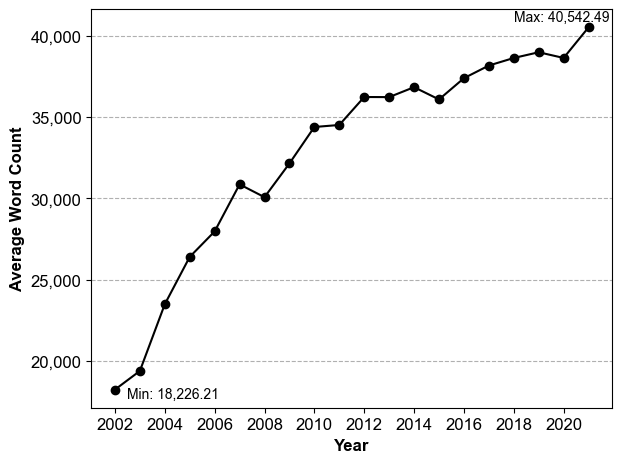

In [6]:
# Visualization of average word count over years
average_word_count_year = filings.groupby(['year'])['word_count'].mean()

plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 12

plt.plot(average_word_count_year.index.values, average_word_count_year.values, color='black', marker='o')

# Find the minimum and maximum values and their corresponding years
min_value = np.min(average_word_count_year.values)
min_year = average_word_count_year.index.values[np.argmin(average_word_count_year.values)]
max_value = np.max(average_word_count_year.values)
max_year = average_word_count_year.index.values[np.argmax(average_word_count_year.values)]

# Annotate the minimum and maximum values on the plot
plt.annotate(f'Min: {min_value:,.2f}', xy=(min_year, min_value), xytext=(min_year + 0.5, min_value - 500), fontsize=10)

plt.annotate(f'Max: {max_value:,.2f}', xy=(max_year, max_value), xytext=(max_year - 3, max_value + 400), fontsize=10)


plt.xticks(ticks=np.arange(2002,2022,2))
plt.yticks(ticks=np.arange(20000,41000,5000), labels=['20,000', '25,000', '30,000', '35,000', '40,000'])
plt.xlabel('Year', fontweight='bold')
plt.ylabel('Average Word Count', fontweight='bold')

plt.grid(axis='y', linestyle='--')

plt.tight_layout()
plt.savefig('./Output_Figures/Line-Plot_Word-Count.png', dpi=600)
plt.show()

In [39]:
#negative_df = pd.read_csv('negative_counts_full.csv')
#negative_weights = pd.read_csv('negative_weights_full.csv')

In [7]:
ar = 'bhar_0_plus3'

In [8]:
### Summary Statistics by Year ###

agg_functions = {'neg_prop_score': ['mean', 'median'],
                 'pos_prop_score': ['mean', 'median'],
                 ar : ['mean', 'median'],
                 'size': ['mean', 'median'],
                 'turnover': ['mean', 'median']}

summ_stats_year = filings.groupby('year').agg(agg_functions)
summ_stats_year.columns = ['Mean_Neg', 'Median_Neg', 'Mean_Pos', 'Median_Pos', \
                           'Mean_EventRet', 'Median_EventRet', 'Mean_Size', 'Median_Size', \
                           'Mean_Turnover', 'Median_Turnover']

new_row = {'Mean_Neg': np.nanmean(filings['neg_prop_score']), 'Median_Neg': np.nanmedian(filings['neg_prop_score']), \
            'Mean_Pos': np.nanmean(filings['pos_prop_score']), 'Median_Pos': np.nanmedian(filings['pos_prop_score']), \
            'Mean_EventRet': np.nanmean(filings[ar]), 'Median_EventRet': np.nanmedian(filings[ar]), \
            'Mean_Size': np.nanmean(filings['size']), 'Median_Size': np.nanmedian(filings['size']), \
            'Mean_Turnover': np.nanmean(filings['turnover']), 'Median_Turnover': np.nanmedian(filings['turnover']), \
          }

# Append the new row to the DataFrame
summ_stats_year.loc[len(summ_stats_year)] = new_row
summ_stats_year = summ_stats_year.rename(index={20: "2002-2021"})

summ_stats_year[['Mean_Size', 'Median_Size']] = summ_stats_year[['Mean_Size', 'Median_Size']] * 1000 / 1e9

# Export the DataFrame to Excel
summ_stats_year.to_excel('./Raw_Output_Tables/Summary_Stats_Year_raw_full.xlsx', index_label='Year')
summ_stats_year


,Mean_Neg,Median_Neg,Mean_Pos,Median_Pos,Mean_EventRet,Median_EventRet,Mean_Size,Median_Size,Mean_Turnover,Median_Turnover
year,,,,,,,,,,
2002,0.016371,0.015905,0.006330,0.006168,0.001659,0.004022,19.305628,8.068651,9.528663,5.730085
2003,0.018272,0.017856,0.006308,0.005769,-0.003512,-0.001470,15.646231,6.052609,9.457319,6.548565
2004,0.018453,0.018125,0.006791,0.006419,0.002577,0.000639,18.730324,8.266967,8.610984,6.497155
2005,0.017993,0.018059,0.006836,0.006644,0.002566,0.001327,20.484839,9.859357,7.977324,5.974879
2006,0.018980,0.018241,0.007340,0.006937,-0.000988,-0.001295,22.611543,11.264888,8.028086,6.407770
2007,0.019518,0.018741,0.007197,0.006736,-0.000459,-0.001333,23.996305,11.853735,9.882160,7.726734
2008,0.019601,0.019032,0.007294,0.007013,0.007361,0.002273,24.179680,10.803456,12.451660,9.988871
2009,0.021042,0.020091,0.007029,0.006861,-0.003157,-0.002750,16.009527,6.285627,15.928691,12.868840
2010,0.021074,0.020466,0.007140,0.006916,0.002239,-0.000006,20.240973,8.885490,15.064503,11.943868


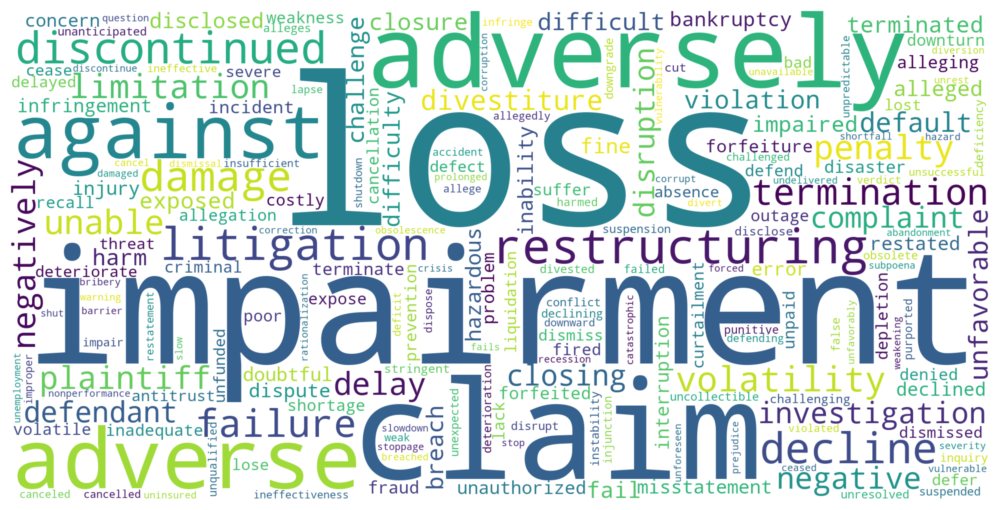

In [51]:
# Word Clouds for negative words 
negative_word_counts = negative_df_final.iloc[:,2:].sum()

plt.figure(figsize=(12,6), dpi=800)
wordcloud = WordCloud(width=2000, height=1000,background_color='white').generate_from_frequencies(negative_word_counts)

plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
# Save the Word Cloud to a file (e.g., 'negative_wordcloud.png')
plt.savefig('./Output_Figures/negative_wordcloud.png', bbox_inches='tight', pad_inches=0, dpi=800)
plt.show()

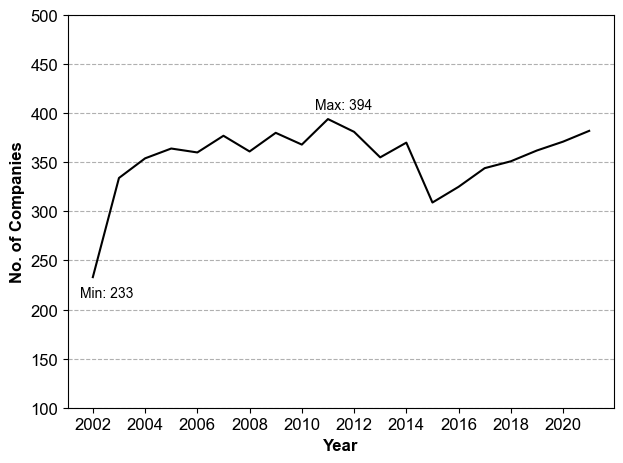

In [141]:
# No. of companies over the years
no_companies_year = filings.groupby(['year'])['permno'].count()

plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 12

plt.plot(no_companies_year.index.values, no_companies_year.values, color='black', marker='o')

# Find the minimum and maximum values and their corresponding years
min_value = np.min(no_companies_year.values)
min_year = no_companies_year.index.values[np.argmin(no_companies_year.values)]
max_value = np.max(no_companies_year.values)
max_year = no_companies_year.index.values[np.argmax(no_companies_year.values)]

# Annotate the minimum and maximum values on the plot
plt.annotate(f'Min: {min_value}', xy=(min_year, min_value), xytext=(min_year - 0.5, min_value - 20), fontsize=10)

plt.annotate(f'Max: {max_value}', xy=(max_year, max_value), xytext=(max_year - 0.5, max_value + 10), fontsize=10)


plt.xticks(ticks=np.arange(2002,2022,2))
plt.yticks(ticks=np.arange(100, 501, 50))#, labels=['2000', '25,000', '30,000', '35,000', '40,000'])
plt.xlabel('Year', fontweight='bold')
plt.ylabel('No. of Companies', fontweight='bold')

plt.grid(axis='y', linestyle='--')

plt.tight_layout()
plt.savefig('./Line-Plot_No_Companies.png', dpi=300)

plt.show()

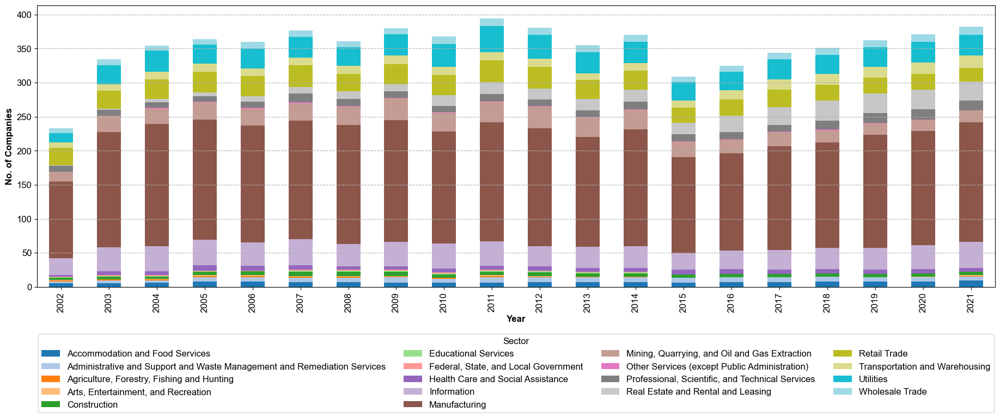

In [142]:
# Assuming 'sector' is the column representing the sector in your DataFrame

# Create a DataFrame with the count of companies per sector and year
companies_per_sector = filings.groupby(['year', 'sector'])['permno'].count().unstack()

# Set the font family and size
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 12

# Plotting the stacked bar chart
ax = companies_per_sector.plot(kind='bar', stacked=True, colormap='tab20', figsize=(20, 8))

# Labeling axes and providing legend
plt.xlabel('Year', fontweight='bold')
plt.ylabel('No. of Companies', fontweight='bold')
plt.legend(title='Sector', loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=4)

# Adding gridlines
plt.grid(axis='y', linestyle='--')

# Tight layout and saving the figure
plt.tight_layout()

plt.savefig('./Stacked-Bar-Chart_Companies_Per_Sector.png', dpi=300)

# Display the plot
plt.show()


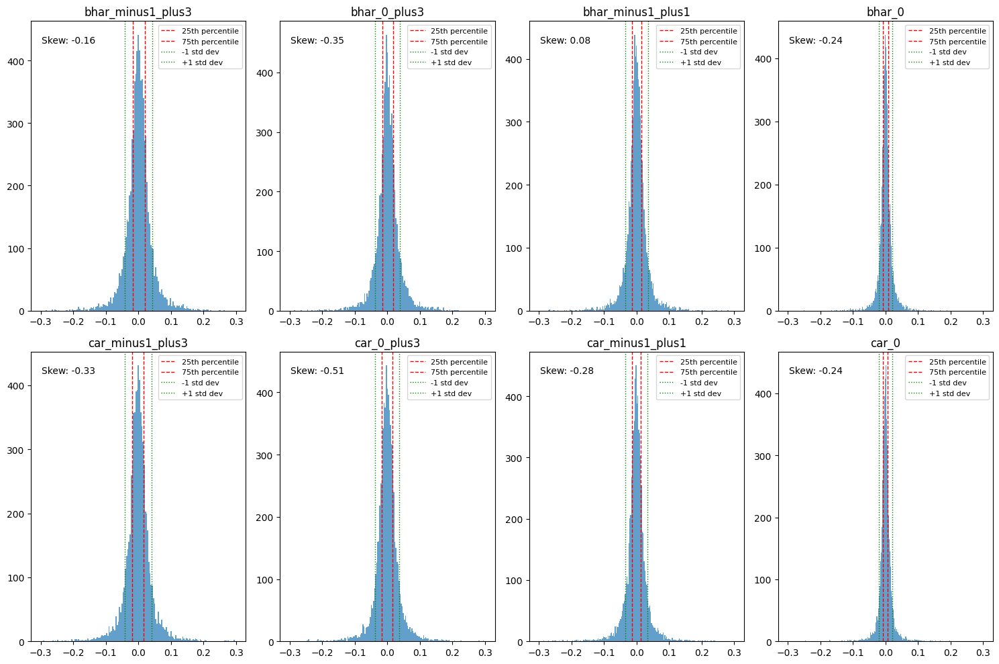

In [175]:
# Compare distributions of different ways of calculating filing period excess returns

### ALONG WITH 25th and 75th PERCENTILES & SD-Intervals

# Subplots with 2 rows of 4 plots each
# Top Row = BHAR
# Bottom Row = CAR

fig, axs = plt.subplots(2, 4, figsize=(15, 10))

# Loop over all ways of calculating AR & plot histograms
for i, col in enumerate(ar):
    
    # Get the data for the current column
    data = filings[col]

    # Calculate the 25th and 75th percentiles
    q25 = np.percentile(data, 25)
    q75 = np.percentile(data, 75)

    # Calculate the mean and standard deviation (SD)   
    mean_value = np.mean(data)
    std_dev = np.std(data)

    # Create the histogram in the appropriate subplot
    axs[i // 4, i % 4].hist(data, bins='auto', alpha=0.7, range=(-0.3, 0.3))
    axs[i // 4, i % 4].axvline(q25, color='red', linestyle='dashed', linewidth=1, label='25th percentile')
    axs[i // 4, i % 4].axvline(q75, color='red', linestyle='dashed', linewidth=1, label='75th percentile')
    axs[i // 4, i % 4].axvline(mean_value - std_dev, color='green', linestyle='dotted', linewidth=1, label='-1 std dev')
    axs[i // 4, i % 4].axvline(mean_value + std_dev, color='green', linestyle='dotted', linewidth=1, label='+1 std dev')
    axs[i // 4, i % 4].set_title(col)
    axs[i // 4, i % 4].legend(loc='upper right', prop={'size': 8})

    # Calculate skewness and add it as text in the plot
    skewness = data.skew()
    axs[i // 4, i % 4].text(0.05, 0.95, f"Skew: {skewness:.2f}", transform=axs[i // 4, i % 4].transAxes, fontsize=10,
                           verticalalignment='top')

# Adjust spacing between subplots and add overall title
plt.tight_layout()

# Show the plot
plt.show()

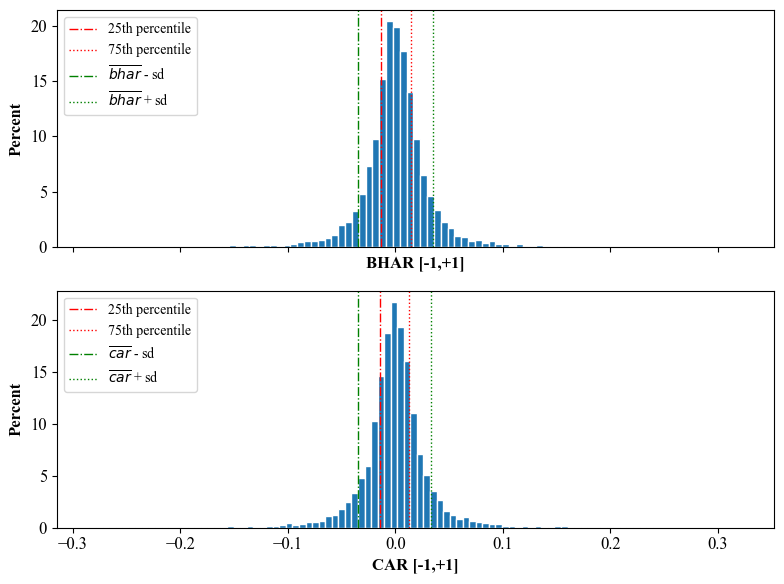

In [179]:
# Histogram: BHAR & CAR - Full Sample [-1,+1]

bhar_data = filings['bhar_minus1_plus1']
car_data = filings['car_minus1_plus1']

bhar_q25 = np.percentile(bhar_data, 25)
bhar_q75 = np.percentile(bhar_data, 75)

car_q25 = np.percentile(car_data, 25)
car_q75 = np.percentile(car_data, 75)

# Calculate the mean and standard deviation (SD)   
bhar_mean_value = np.mean(bhar_data)
bhar_std_dev = np.std(bhar_data)

car_mean_value = np.mean(car_data)
car_std_dev = np.std(car_data)


plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['font.size'] = 12

fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(8, 6), sharex=True)

# Histogram of BHAR returns
ax[0].hist(bhar_data, density=True, bins='scott', edgecolor='white')
ax[0].set_xlabel('BHAR [-1,+1]', fontweight='bold')
ax[0].set_ylabel('Percent', fontweight='bold')

ax[0].axvline(bhar_q25, color='red', linestyle='dashdot', linewidth=1, label='25th percentile')
ax[0].axvline(bhar_q75, color='red', linestyle='dotted', linewidth=1, label='75th percentile')
ax[0].axvline(bhar_mean_value - bhar_std_dev, color='green', linestyle='dashdot', linewidth=1, label=r'$\overline{bhar}$ - sd')
ax[0].axvline(bhar_mean_value + bhar_std_dev, color='green', linestyle='dotted', linewidth=1, label=r'$\overline{bhar}$ + sd')
ax[0].legend(loc='upper left', prop={'size': 10})
#r'Mean $\pm$ 1 SD'

# Histogram of CAR returns
ax[1].hist(car_data, density=True, bins='scott', edgecolor='white')
ax[1].set_xlabel('CAR [-1,+1]', fontweight='bold')
ax[1].set_ylabel('Percent', fontweight='bold')

ax[1].axvline(car_q25, color='red', linestyle='dashdot', linewidth=1, label='25th percentile')
ax[1].axvline(car_q75, color='red', linestyle='dotted', linewidth=1, label='75th percentile')
ax[1].axvline(car_mean_value - car_std_dev, color='green', linestyle='dashdot', linewidth=1, label=r'$\overline{car}$ - sd')
ax[1].axvline(car_mean_value + car_std_dev, color='green', linestyle='dotted', linewidth=1, label=r'$\overline{car}$ + sd')
ax[1].legend(loc='upper left', prop={'size': 10})


plt.tight_layout()
plt.savefig('./Output_Figures/hist_returns_bhar_vs_car.png', dpi=300)
plt.show()



In [180]:
# Correlation BHAR vs. CAR for period [-1, +1]

pd.concat([filings['bhar_minus1_plus1'], filings['car_minus1_plus1']], axis=1).corr()

,bhar_minus1_plus1,car_minus1_plus1
bhar_minus1_plus1,1.000000,0.925113
car_minus1_plus1,0.925113,1.000000


In [181]:
# Initialize new DataFrame that will hold the sentiment labels based on different AR's

sentiment_labels = pd.DataFrame(columns={'sent_' + method: method for method in ar})
sd_sentiment_labels = pd.DataFrame(columns={'sd_sent_' + method: method for method in ar})

In [182]:
# Assign final sentiment for all methods of AR-calculation based on ...
# ... percentiles 
#     - Bottom 25% = 'negative'
#     - Middle 50% = 'neutral'
#     - Top 25%    = 'positive'
# ... SD-interval
#     - Below  (mean_ar - sd_ar)   = 'negative'
#     - Within (mean_ar +/- sd_ar) = 'neutral'
#     - Above  (mean_ar + sd_ar)   = 'positive'

for method in tqdm(ar):
    
    grouped = filings.groupby('year')[method]
    perc_25 = grouped.quantile(0.25)
    perc_75 = grouped.quantile(0.75)

    mean_ar = grouped.mean()
    sd_ar = grouped.std()
    sd_lower_thresh = mean_ar - sd_ar
    sd_upper_thresh = mean_ar + sd_ar

    
    for index, filing in filings.iterrows():
        
        year = filing['year']

        # Percentile-Based Classification
        if (filings.loc[index, method] <= perc_25[year]):
            sentiment_labels.loc[index, 'sent_' + method] = 'negative'
        elif (filings.loc[index, method] >= perc_75[year]):
            sentiment_labels.loc[index, 'sent_' + method] = 'positive'
        else:
            sentiment_labels.loc[index, 'sent_' + method] = 'neutral'

        # SD-Based Classification
        if (filings.loc[index, method] <= sd_lower_thresh[year]):
            sd_sentiment_labels.loc[index, 'sd_sent_' + method] = 'negative'
        elif (filings.loc[index, method] >= sd_upper_thresh[year]):
            sd_sentiment_labels.loc[index, 'sd_sent_' + method] = 'positive'
        else:
            sd_sentiment_labels.loc[index, 'sd_sent_' + method] = 'neutral'

  0%|          | 0/8 [00:00<?, ?it/s]

In [183]:
# Save DataFrames 

sentiment_labels.to_csv('sentiment_labels_full.csv', index=False)
sd_sentiment_labels.to_csv('sd_sentiment_labels_full.csv', index=False)

In [184]:
sentiment_labels.head()

,sent_bhar_minus1_plus3,sent_bhar_0_plus3,sent_bhar_minus1_plus1,sent_bhar_0,sent_car_minus1_plus3,sent_car_0_plus3,sent_car_minus1_plus1,sent_car_0
0,negative,negative,negative,neutral,negative,negative,negative,neutral
1,neutral,neutral,negative,negative,positive,positive,neutral,negative
2,positive,positive,neutral,positive,positive,positive,neutral,positive
3,neutral,neutral,neutral,neutral,positive,positive,neutral,positive
4,neutral,neutral,positive,positive,neutral,neutral,positive,positive


In [187]:
# Convert string labels into numbers so that calculations can be performed 
# 0 = 'negative'
# 1 = 'neutral'
# 2 = 'positive'

le = LabelEncoder()

# Loop through each column and apply the LabelEncoder
for column in sentiment_labels.columns:
    sentiment_labels['encoded_' + column] = le.fit_transform(sentiment_labels[column])

for column in sd_sentiment_labels.columns:
    sd_sentiment_labels['encoded_' + column] = le.fit_transform(sd_sentiment_labels[column])

sentiment_labels.head()

,sent_bhar_minus1_plus3,sent_bhar_0_plus3,sent_bhar_minus1_plus1,sent_bhar_0,sent_car_minus1_plus3,sent_car_0_plus3,sent_car_minus1_plus1,sent_car_0,encoded_sent_bhar_minus1_plus3,encoded_sent_bhar_0_plus3,encoded_sent_bhar_minus1_plus1,encoded_sent_bhar_0,encoded_sent_car_minus1_plus3,encoded_sent_car_0_plus3,encoded_sent_car_minus1_plus1,encoded_sent_car_0
0,negative,negative,negative,neutral,negative,negative,negative,neutral,0,0,0,1,0,0,0,1
1,neutral,neutral,negative,negative,positive,positive,neutral,negative,1,1,0,0,2,2,1,0
2,positive,positive,neutral,positive,positive,positive,neutral,positive,2,2,1,2,2,2,1,2
3,neutral,neutral,neutral,neutral,positive,positive,neutral,positive,1,1,1,1,2,2,1,2
4,neutral,neutral,positive,positive,neutral,neutral,positive,positive,1,1,2,2,1,1,2,2


In [188]:
# Correlation matrix for percentile-based sentiment labels

(sentiment_labels.select_dtypes(include=np.number)).corr()

,encoded_sent_bhar_minus1_plus3,encoded_sent_bhar_0_plus3,encoded_sent_bhar_minus1_plus1,encoded_sent_bhar_0,encoded_sent_car_minus1_plus3,encoded_sent_car_0_plus3,encoded_sent_car_minus1_plus1,encoded_sent_car_0
encoded_sent_bhar_minus1_plus3,1.000000,0.772472,0.664045,0.338764,0.776966,0.662640,0.581461,0.310955
encoded_sent_bhar_0_plus3,0.772472,1.000000,0.506461,0.399719,0.667697,0.775843,0.443820,0.365449
encoded_sent_bhar_minus1_plus1,0.664045,0.506461,1.000000,0.449157,0.584270,0.445787,0.782865,0.406742
encoded_sent_bhar_0,0.338764,0.399719,0.449157,1.000000,0.303933,0.353933,0.398596,0.803090
encoded_sent_car_minus1_plus3,0.776966,0.667697,0.584270,0.303933,1.000000,0.767416,0.662640,0.345506
encoded_sent_car_0_plus3,0.662640,0.775843,0.445787,0.353933,0.767416,1.000000,0.495506,0.401124
encoded_sent_car_minus1_plus1,0.581461,0.443820,0.782865,0.398596,0.662640,0.495506,1.000000,0.449157
encoded_sent_car_0,0.310955,0.365449,0.406742,0.803090,0.345506,0.401124,0.449157,1.000000


In [189]:
# Correlation matrix for standard-deviation based sentiment lables 

(sd_sentiment_labels.select_dtypes(include=np.number)).corr()

,encoded_sd_sent_bhar_minus1_plus3,encoded_sd_sent_bhar_0_plus3,encoded_sd_sent_bhar_minus1_plus1,encoded_sd_sent_bhar_0,encoded_sd_sent_car_minus1_plus3,encoded_sd_sent_car_0_plus3,encoded_sd_sent_car_minus1_plus1,encoded_sd_sent_car_0
encoded_sd_sent_bhar_minus1_plus3,1.000000,0.762518,0.622642,0.348019,0.751839,0.653757,0.568417,0.315717
encoded_sd_sent_bhar_0_plus3,0.762518,1.000000,0.495158,0.388266,0.653137,0.767890,0.465100,0.362218
encoded_sd_sent_bhar_minus1_plus1,0.622642,0.495158,1.000000,0.443380,0.567895,0.449542,0.774059,0.405417
encoded_sd_sent_bhar_0,0.348019,0.388266,0.443380,1.000000,0.322947,0.354500,0.417229,0.793419
encoded_sd_sent_car_minus1_plus3,0.751839,0.653137,0.567895,0.322947,1.000000,0.753171,0.639123,0.344780
encoded_sd_sent_car_0_plus3,0.653757,0.767890,0.449542,0.354500,0.753171,1.000000,0.506982,0.387452
encoded_sd_sent_car_minus1_plus1,0.568417,0.465100,0.774059,0.417229,0.639123,0.506982,1.000000,0.445418
encoded_sd_sent_car_0,0.315717,0.362218,0.405417,0.793419,0.344780,0.387452,0.445418,1.000000


In [190]:
# Correlation matrix of all possible sentiment labels

all_sent_labels = pd.concat([sentiment_labels.select_dtypes(include=np.number), sd_sentiment_labels.select_dtypes(include=np.number)], axis=1)
all_sent_labels.corr()

,encoded_sent_bhar_minus1_plus3,encoded_sent_bhar_0_plus3,encoded_sent_bhar_minus1_plus1,encoded_sent_bhar_0,encoded_sent_car_minus1_plus3,encoded_sent_car_0_plus3,encoded_sent_car_minus1_plus1,encoded_sent_car_0,encoded_sd_sent_bhar_minus1_plus3,encoded_sd_sent_bhar_0_plus3,encoded_sd_sent_bhar_minus1_plus1,encoded_sd_sent_bhar_0,encoded_sd_sent_car_minus1_plus3,encoded_sd_sent_car_0_plus3,encoded_sd_sent_car_minus1_plus1,encoded_sd_sent_car_0
encoded_sent_bhar_minus1_plus3,1.000000,0.772472,0.664045,0.338764,0.776966,0.662640,0.581461,0.310955,0.652601,0.609551,0.526848,0.308662,0.600320,0.552541,0.488993,0.279238
encoded_sent_bhar_0_plus3,0.772472,1.000000,0.506461,0.399719,0.667697,0.775843,0.443820,0.365449,0.606110,0.636897,0.415542,0.346822,0.543932,0.597484,0.394217,0.318351
encoded_sent_bhar_minus1_plus1,0.664045,0.506461,1.000000,0.449157,0.584270,0.445787,0.782865,0.406742,0.547996,0.444152,0.605689,0.401405,0.497086,0.410220,0.581939,0.362415
encoded_sent_bhar_0,0.338764,0.399719,0.449157,1.000000,0.303933,0.353933,0.398596,0.803090,0.297459,0.344030,0.365454,0.581578,0.269363,0.318570,0.339731,0.547584
encoded_sent_car_minus1_plus3,0.776966,0.667697,0.584270,0.303933,1.000000,0.767416,0.662640,0.345506,0.609123,0.554859,0.475833,0.281611,0.647600,0.605415,0.533406,0.301518
encoded_sent_car_0_plus3,0.662640,0.775843,0.445787,0.353933,0.767416,1.000000,0.495506,0.401124,0.553592,0.594995,0.375657,0.323636,0.604658,0.637581,0.424893,0.342116
encoded_sent_car_minus1_plus1,0.581461,0.443820,0.782865,0.398596,0.662640,0.495506,1.000000,0.449157,0.487729,0.392988,0.569979,0.362762,0.538727,0.431810,0.613531,0.385685
encoded_sent_car_0,0.310955,0.365449,0.406742,0.803090,0.345506,0.401124,0.449157,1.000000,0.270339,0.314479,0.328352,0.551630,0.306666,0.345889,0.369034,0.567388
encoded_sd_sent_bhar_minus1_plus3,0.652601,0.606110,0.547996,0.297459,0.609123,0.553592,0.487729,0.270339,1.000000,0.762518,0.622642,0.348019,0.751839,0.653757,0.568417,0.315717
encoded_sd_sent_bhar_0_plus3,0.609551,0.636897,0.444152,0.344030,0.554859,0.594995,0.392988,0.314479,0.762518,1.000000,0.495158,0.388266,0.653137,0.767890,0.465100,0.362218


In [191]:
corr_matrix_labels = pd.concat([sentiment_labels[['encoded_sent_bhar_minus1_plus1', 'encoded_sent_car_minus1_plus1']], \
                                sd_sentiment_labels[['encoded_sd_sent_bhar_minus1_plus1', 'encoded_sd_sent_car_minus1_plus1']]], \
                               axis=1).corr() 

corr_matrix_labels.to_excel('./Raw_Output_Tables/Corr_Matrix_True_Labels_raw_full.xlsx', index=False, startrow=2, startcol=1)
corr_matrix_labels

,encoded_sent_bhar_minus1_plus1,encoded_sent_car_minus1_plus1,encoded_sd_sent_bhar_minus1_plus1,encoded_sd_sent_car_minus1_plus1
encoded_sent_bhar_minus1_plus1,1.000000,0.782865,0.605689,0.581939
encoded_sent_car_minus1_plus1,0.782865,1.000000,0.569979,0.613531
encoded_sd_sent_bhar_minus1_plus1,0.605689,0.569979,1.000000,0.774059
encoded_sd_sent_car_minus1_plus1,0.581939,0.613531,0.774059,1.000000


In [192]:
# Add in the years
all_sent_labels = pd.concat([filings.year, filings.filing_date, filings.permno, \
                             sentiment_labels[['encoded_sent_bhar_minus1_plus1', 'encoded_sent_car_minus1_plus1']], \
                             sd_sentiment_labels[['encoded_sd_sent_bhar_minus1_plus1', 'encoded_sd_sent_car_minus1_plus1']]], \
                            axis=1)
all_sent_labels.head()

,year,filing_date,permno,encoded_sent_bhar_minus1_plus1,encoded_sent_car_minus1_plus1,encoded_sd_sent_bhar_minus1_plus1,encoded_sd_sent_car_minus1_plus1
0,2002,2002-01-14,30382,0,0,0,0
1,2002,2002-01-22,87432,0,1,0,1
2,2002,2002-01-23,14702,1,1,1,1
3,2002,2002-01-28,60871,1,1,1,1
4,2002,2002-01-28,90609,2,2,1,1


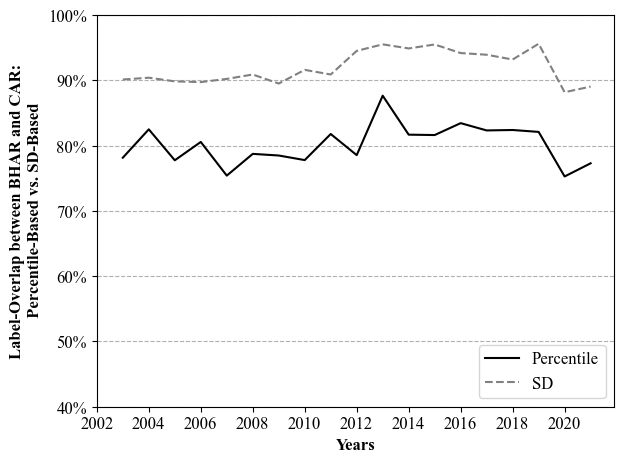

In [193]:
# Overlap between PERCENTILE-BASED BHAR- and CAR-labels for the same respective time window [-1, +1] (percentile vs. sd)

# Overlap between BHAR-based and CAR-based labels for percentile-based approach
all_sent_labels['perc_overlap'] = (all_sent_labels['encoded_sent_bhar_minus1_plus1'] == \
                                   all_sent_labels['encoded_sent_car_minus1_plus1'])

perc_overlap_percentage = (all_sent_labels.groupby('year')['perc_overlap'].sum()) / (all_sent_labels.groupby('year')['year'].count())


# Overlap between BHAR-based and CAR-based labels for SD-based approach
all_sent_labels['sd_overlap'] = (all_sent_labels['encoded_sd_sent_bhar_minus1_plus1'] == \
                                 all_sent_labels['encoded_sd_sent_car_minus1_plus1'])

sd_overlap_percentage = (all_sent_labels.groupby('year')['sd_overlap'].sum()) / (all_sent_labels.groupby('year')['year'].count())



plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['font.size'] = 12

plt.plot(perc_overlap_percentage.index.values[1:], perc_overlap_percentage.values[1:], color='black', linestyle='solid')
plt.plot(sd_overlap_percentage.index.values[1:], sd_overlap_percentage.values[1:], color='gray', linestyle='dashed')

ymin = 0.4
ymax = 1.0
plt.ylim(ymin, ymax)

yticks = np.arange(ymin, ymax+0.1, 0.1)
ylabels = [str(round(value*100)) + '%' for value in yticks]

plt.yticks(ticks=yticks, labels=ylabels)
plt.xticks(ticks=np.arange(2002, 2022, 2))
plt.xlabel('Years', font='Times New Roman', fontweight='bold', fontsize=12)
plt.ylabel('Label-Overlap between BHAR and CAR:\n Percentile-Based vs. SD-Based', font='Times New Roman', fontweight='bold', fontsize=12)

plt.legend(['Percentile', 'SD'], loc='lower right')

plt.grid(axis='y', linestyle='--')

plt.tight_layout()
plt.savefig('./Output_Figures/True_Label-Overlap_bhar_vs_car.png', dpi=300)
plt.show()

